## Code Details
Author: Rory Angus<br>
Created: 05FEB19<br>
Version: 0.2<br>
***
This code looks at the inSITE students data after it has been programically and manually cleaned. This code needs work to remove the identifying features of the students. <br>
It is currently like this because it is being shared with the nominated coach, Pam Ryan, who has permission to look at the individual results.

# Package Importing + Variable Setting

In [1]:
import matplotlib
matplotlib.use('module://ipykernel.pylab.backend_inline')
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from itertools import cycle, islice

import pandas as pd
import numpy as np
from math import pi
from math import ceil
from math import floor
import datetime
import random
# for the Boxplots
import seaborn as sns

# mongo stuff
import pymongo
from pymongo import MongoClient
from bson.objectid import ObjectId

In [2]:
# the file to read. This needs to be manually updated
readLoc = '~/datasets/CLARA/UserSaved/InsiteTest_newformat_Corrected.csv'

# if true the code outputs to the notebook a whole of diagnostic data that is helpful when writing but not so much when running it for real
verbose = True
# if true will reset anything that needs resetting to ensure a clean run
firstRun = True
# if ture this will delete variables as it goes along
cleanUp = False


# set the variables to define the chart axes length
x_min = 0
x_max = 100

# define how big the figures should be 
# the first number is the - Width
# the second number is the - Height
# SpiderChart  or Combined Radar Chart (crc)
crcFigSize = (15, 15)
# Box Plot (bpl)
bplFigSize = (15, 10)
# Parallel Coordinates (pcc)
pccFigSize = (15, 8)

In [3]:
# this is set because the code requires the following fields to be set

# query_field = 'userPrimaryEmail'
query_field = 'Student Index'
analyse_variable = query_field

# set the font for the charts
font = {'family': 'DejaVu Sans', 'weight': 'normal', 'size': 16}
matplotlib.rc('font', **font)
fontTitle = 32

# Set display options

In [4]:
# further details found by running:
# pd.describe_option('display')
# set the values to show all of the columns etc.
pd.set_option('display.max_columns', None)  # or 1000
pd.set_option('display.max_rows', None)  # or 1000
pd.set_option('display.max_colwidth', -1)  # or 199

# locals() # show all of the local environments

# Define functions 

In [5]:
def chartColour(listOfStudents, dictionary):
    """
    This is specifcally for students data frame with a column called 'Student Index'.
    The function ensure that each chart maintains the students colour correctly
    It does this by steping through each of the students that are passed into the chart and use the Dictionary to
    look up their assigned colour.
    This colour is placed into a list so it can be used later on in the chart
    """
    # set up the colour for the chart starts here ----------------------------------------------
    # create list variable
    lstLocalChartColour = []
    # loop through each student and use the dictionary to look up their colour
    for student in listOfStudents:
        lstLocalChartColour.append(dictionary[student])
    # return the list
    return lstLocalChartColour

In [6]:
# This produces a table showing the position of each score in relation to the others
# https://pandas.pydata.org/pandas-docs/stable/style.html


def color_negative_red(val):
    """
    Takes a scalar and returns a string with
    the css property `'color: red'` for negative
    strings, black otherwise.
    This function is used for colouring the text
    """
    color = 'red' if val < 0 else 'black'
    return 'text-align: center; color: %s' % color

In [7]:
def parallelCoords(df,
                   class_column,
                   color="black",
                   title="No Title Supplied",
                   baseline=None):
    '''This creates a parallel coordinate chart. It requires the passing of a df with the first column being the class coloumn.
    The is the coloumn that is used to identify each row. It will plot all of the other rows of data that are passed in.
    Remember pass in the title and the colours otherwise the rows will be black.
    You need to ensure that the column names are correct
    
    If you want a base line enter a number and it will be drawn on the chart.
    '''
   
    
    # remove the first column and create a variable to hold the columns that I want to plot
    plot_cols = df.columns[1:]

    # this sets the figure size
    plt.figure(figsize=pccFigSize)

    # Set the title
    plt.title(title, fontsize=30, pad=20)
    # create the plot
    pd.plotting.parallel_coordinates(
        df,
        class_column=class_column  # defined at the top of the program
        ,
        cols=plot_cols  # defined above to specify the columns to plot
        ,
        color=color)  # colour pallet defined aboove
    # rotate the labels and set their size
    plt.tick_params(labelrotation=90, labelsize=15)
    # place the legend to the right and set the font size
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1), fontsize=15)
    if baseline is not None:
        plt.axhline(y=baseline, linewidth=4, color='r')

In [8]:
# this function is for creating the individual charts
def individualCharts(df, analyseVariable, title="", colour=["Black"]):
    """Display Individual Radar + Bar charts for a suplied dataframe of the following format.
    It needs to contain the following coloumns in this order for it to work:
    [ analyseVariable, 'Mindful Agency', 'Sense Making', 'Creativity',
       'Curiosity', 'Hope & Optimism', 'Belonging', 'Collaboration',
       'Orientation to Learning']
       
    analyseVariable = Used to perform the grouping or looping and is the identifier for the data. Usually
    this is the email or some number (row index for anaymous purposes).
    Title = used to populate the following string -> 'Chart of Student ' + analyseVariable + title
    Colour = a list of colours that are to be used. Needs to be the same length as the data
    """

     # data manipulation starts here ----------------------------------------------

    # make a copy so that changes to the df do not affect the passed in dataframe
    dfRadar = df.copy()

    # rename the columns to make them more human readable but also to make the function work with
    # both diagnose and measure results
    dfRadar.columns = [
        analyseVariable, 'Mindful Agency', 'Sense Making', 'Creativity',
        'Curiosity', 'Hope & Optimism', 'Belonging', 'Collaboration',
        'Orientation to Learning'
    ]

    # create a dataframe with the right structure for orientation to learning
    # defines the width of the line for each reading
    width = 1
    # create a new dataframe with the two variables we need
    dfOrient = dfRadar[[analyseVariable, 'Orientation to Learning']].copy()
    # add the width as a new column with all of the same value for all of the rows
    dfOrient['width'] = width

    # drop the Orientation to Learning column from the data frame as it is no longer needed
    dfRadar.drop('Orientation to Learning', axis=1, inplace=True)

    # data manipulation ends here ----------------------------------------------

    # define the shape of the report canvas using grid spec
    gs = gridspec.GridSpec(3, 3)

    # loop through all the data rows
    for index, row in dfRadar.iterrows():

        # this sets the figure size
        plt.figure(figsize=crcFigSize)

        # ------- PART 1: Create background

        # number of variable
        categories = list(dfRadar)[1:]
        N = len(categories)

        # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
        angles = [n / float(N) * 2 * pi for n in range(N)]
        angles += angles[:1]

        plt.suptitle(
            'Chart of Student ' + str(dfRadar[analyseVariable].loc[index]) +
            title,
            fontsize=24)
        # Initialise the spider plot
        ax = plt.subplot(gs[:2, 0:], projection='polar', label='spider')

        # If you want the first axis to be on top:
        ax.set_theta_offset(pi / 2)
        ax.set_theta_direction(-1)

        # Draw one axe per variable + add labels labels yet
        plt.xticks(angles[:-1], categories)

        # Draw ylabels
        ax.set_rlabel_position(0)
        plt.yticks(
            [10, 20, 30, 40, 50, 60, 70, 80, 90, 100],
            ["10", "20", "30", "40", "50", "60", "70", "80", "90", "100"],
            color="darkgrey",
            size=10)
        plt.ylim(x_min, x_max)

        # ------- PART 2: Add plots

        # Plot each individual = each line of the data
        # remove the analyse_variable from the df that was passed in and then create the list of values from it

        values = dfRadar.loc[index].drop(
            analyse_variable).values.flatten().tolist()
        values += values[:1]
        # plot the values for the current run through the loop
        ax.plot(
            angles,
            values,
            linewidth=3,
            linestyle='solid',
            label=dfRadar[analyseVariable].iloc[index],
            color=colour[index])
        ax.fill(angles, values, 'b', alpha=0)

        # Add legend
        plt.legend(loc='upper right', bbox_to_anchor=(1.5, 1.1))

        # put the copyright symbol at the bottom of the chart
        plt.text(
            1.35, -.65, r'$\copyright \  \ UTS:CIC$', transform=ax.transAxes)

        # orient to learning plot

        # add orientation to learning plot with this section
        #initalise the sub plot
        ax_ol = plt.subplot(
            gs[2, 0:], projection='rectilinear', label='orientation')
        # the range is 1-100
        ax_ol.set_xlim(0, 100)
        # only need a height of one
        ax_ol.set_ylim(0, 1)
        ax_ol.set_xlabel('Orientation to Learning')
        #define what I want to see on the charts x axis
        ax_ol.set_xticks([0, 25, 50, 75, 100])
        # I dont want anything on the yaxis
        ax_ol.set_yticks([])
        # this is the broken bar chart that is used

        dfCurrentOrientValue = [
            tuple(dfOrient[["Orientation to Learning",
                            "width"]].loc[index].values)
        ]

        ax_ol.broken_barh(
            dfCurrentOrientValue, (0.25, 0.5),
            facecolors=colour[index],
            edgecolor='black')

        plt.show()
        print('-' * 100)

In [9]:
# this function is for creating the combined charts


def combinedCharts(df, analyseVariable, sampletotal, title, colour=["Black"]):
    """Display Combined Results Radar + Bar charts for a suplied dataframe of the following format.
    It needs to contain the following coloumns in this order for it to work:
    [ analyseVariable, 'Mindful Agency', 'Sense Making', 'Creativity',
    'Curiosity', 'Hope & Optimism', 'Belonging', 'Collaboration',
    'Orientation to Learning']

    analyseVariable = Used to perform the grouping or looping and is the identifier for the data. Usually
    this is the email or some number (row index for anaymous purposes).
    Title = used to populate the following string -> 'Chart of Student ' + analyseVariable + title
    Colour = a list of colours that are to be used. Needs to be the same length as the data
    """
    

    # data manipulation starts here ----------------------------------------------
    # make a copy so that changes to the df do not affect the passed in dataframe
    dfRadar = df.copy()

    # rename the columns to make them more human readable but also to make the function work with
    # both diagnose and measure results
    dfRadar.columns = [
        analyseVariable, 'Mindful Agency', 'Sense Making', 'Creativity',
        'Curiosity', 'Hope & Optimism', 'Belonging', 'Collaboration',
        'Orientation to Learning'
    ]

    # create a dataframe with the right structure for orientation to learning
    # defines the width of the line for each reading
    width = 1

    # create a new dataframe with the two variables we need
    dfOrient = dfRadar[[analyseVariable, 'Orientation to Learning']].copy()

    # add the width as a new column with all of the same value for all of the rows
    dfOrient['width'] = width

    # convert the dfRadar to  a list of tuples as this is what the chart requires for it to work
    dfOrient = dfOrient[['Orientation to Learning', 'width']].apply(
        tuple, axis=1).tolist()

    # drop the Orientation to Learning column from the data frame as it is no longer needed
    dfRadar.drop('Orientation to Learning', axis=1, inplace=True)

    # data manipulation ends here ----------------------------------------------

    # define the shape of the report canvas using grid spec
    gs = gridspec.GridSpec(3, 3)

    # ------- PART 1: Create background

    # this sets the figure size
    plt.figure(figsize=crcFigSize)

    # number of variable
    categories = list(dfRadar)[1:]
    N = len(categories)

    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]

    plt.suptitle(title, fontsize=24)
    # Initialise the spider plot
    ax = plt.subplot(gs[:2, 0:], projection='polar', label='spider')

    # If you want the first axis to be on top:
    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles[:-1], categories)

    # Draw ylabels
    ax.set_rlabel_position(0)
    plt.yticks([10, 20, 30, 40, 50, 60, 70, 80, 90, 100],
               ["10", "20", "30", "40", "50", "60", "70", "80", "90", "100"],
               color="darkgrey",
               size=10)
    plt.ylim(x_min, x_max)

    # ------- PART 2: Add plots

    # Plot each individual = each line of the data
    # I do a loop, because I want to see all of the values even though it will be crowded

    for index, row in dfRadar.iterrows():
        values = dfRadar.loc[index].drop(
            analyseVariable).values.flatten().tolist()
        values += values[:1]

        #label = "Cluster {0:s} (n={1:0.0f} [{2:.1%}])".format(str(dfClusterMean['cluster_label'].iloc[index])
        #                                ,dfClusterMean['count'].iloc[index]
        #                                ,(dfClusterMean['count'].iloc[index] / sampletotal)
        #                                            )
        radarLabel = dfRadar[analyseVariable].iloc[index]

        ax.plot(
            angles,
            values,
            linewidth=2,
            linestyle='solid',
            label=radarLabel,
            color=colour[index])
        ax.fill(angles, values, 'b', alpha=0)

    # Add legend
    plt.legend(loc='upper right', bbox_to_anchor=(1.5, 1.1))

    # put in text for the error calculation
    plt.text(
        0.99, 0.9, r'$N=' + str(sampletotal) + ' $', transform=ax.transAxes)
    # put the copyright symbol at the bottom of the chart
    plt.text(1.35, -.65, r'$\copyright \  \ UTS:CIC$', transform=ax.transAxes)

    # add orientation to learning

    # add orientation to learning
    #initalise the sub plot
    ax_ol = plt.subplot(
        gs[2, 0:], projection='rectilinear', label='orientation')
    # the range is 1-100
    ax_ol.set_xlim(0, 100)
    # only need a height of one
    ax_ol.set_ylim(0, 1)
    ax_ol.set_xlabel('Orientation to Learning')
    #define what I want to see on the charts x axis
    ax_ol.set_xticks([0, 25, 50, 75, 100])
    # I dont want anything on the yaxis
    ax_ol.set_yticks([])
    # this is the broken bar chart that is used
    ax_ol.broken_barh(
        dfOrient, (0.25, 0.5), facecolors=colour, edgecolor='black')

    ax_ol.set_xlim(0, 100)
    ax_ol.set_ylim(0, 1)
    ax_ol.set_xlabel('Orientation to Learning')
    ax_ol.set_xticks([0, 25, 50, 75, 100])
    ax_ol.set_yticks([])

    plt.show()
    print('-' * 100)

In [10]:
# this function is for creating the combined charts
def combinedChartsMultiSample(df, analyseVariable, title, colour=["Black"]):
    """Display Combined Results Radar + Bar charts for a suplied dataframe of the following format.
    It needs to contain the following coloumns in this order for it to work:
    [ analyseVariable, 'Sample Size', 'Mindful Agency', 'Sense Making', 'Creativity',
    'Curiosity', 'Hope & Optimism', 'Belonging', 'Collaboration',
    'Orientation to Learning']

    analyseVariable = Used to perform the grouping or looping and is the identifier for the data. Usually
    this is the email or some number (row index for anaymous purposes).
    Title = used to populate the following string -> 'Chart of Student ' + analyseVariable + title
    Colour = a list of colours that are to be used. Needs to be the same length as the data
    """

    # data manipulation starts here ----------------------------------------------
    # make a copy so that changes to the df do not affect the passed in dataframe
    dfRadar = df.copy()

    # rename the columns to make them more human readable but also to make the function work with
    # both diagnose and measure results
    dfRadar.columns = [
        analyseVariable, 'Sample', 'Mindful Agency', 'Sense Making',
        'Creativity', 'Curiosity', 'Hope & Optimism', 'Belonging',
        'Collaboration', 'Orientation to Learning'
    ]

    # create a dataframe with the right structure for orientation to learning
    # defines the width of the line for each reading
    width = 1

    # create a new dataframe with the two variables we need
    dfOrient = dfRadar[[analyseVariable, 'Orientation to Learning']].copy()

    # add the width as a new column with all of the same value for all of the rows
    dfOrient['width'] = width

    # convert the dfRadar to  a list of tuples as this is what the chart requires for it to work
    dfOrient = dfOrient[['Orientation to Learning', 'width']].apply(
        tuple, axis=1).tolist()

    # drop the Orientation to Learning column from the data frame as it is no longer needed
    dfRadar.drop('Orientation to Learning', axis=1, inplace=True)

    # calculate the total sample size from the dataframe
    sampletotal = dfRadar['Sample'].sum()
    # data manipulation ends here ----------------------------------------------

    # define the shape of the report canvas using grid spec
    gs = gridspec.GridSpec(3, 3)

    # ------- PART 1: Create background

    # this sets the figure size
    plt.figure(figsize=crcFigSize)

    # number of variables - Drop the first two values as they are not needed as they contain other data
    categories = list(dfRadar)[2:]
    N = len(categories)

    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]

    plt.suptitle(title, fontsize=24)
    # Initialise the spider plot
    ax = plt.subplot(gs[:2, 0:], projection='polar', label='spider')

    # If you want the first axis to be on top:
    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles[:-1], categories)

    # Draw ylabels
    ax.set_rlabel_position(0)
    plt.yticks([10, 20, 30, 40, 50, 60, 70, 80, 90, 100],
               ["10", "20", "30", "40", "50", "60", "70", "80", "90", "100"],
               color="darkgrey",
               size=10)
    plt.ylim(x_min, x_max)

    # ------- PART 2: Add plots

    # Plot each individual = each line of the data
    # I do a loop, because I want to see all of the values even though it will be crowded

    for index, row in dfRadar.iterrows():
        values = dfRadar.loc[index].drop(
            analyseVariable).values.flatten().tolist()

        # remove the first value
        del values[:1]

        values += values[:1]

        radarLabel = "Cluster {0:s} (n={1:0.0f} [{2:.1%}])".format(
            str(dfClusterMean['cluster_label'].iloc[index]),
            dfClusterMean['count'].iloc[index],
            (dfClusterMean['count'].iloc[index] / sampletotal))

        # Call the plot function passing the values required
        # this is called n times based on the loop so draws a line at a time.
        ax.plot(
            angles,
            values,
            linewidth=2,
            linestyle='solid',
            label=radarLabel,
            color=colour[index])
        ax.fill(angles, values, 'b', alpha=0)

    # Add legend
    plt.legend(loc='upper right', bbox_to_anchor=(1.5, 1.1))

    # put in text for the error calculation
    plt.text(
        0.99, 0.9, r'$N=' + str(sampletotal) + ' $', transform=ax.transAxes)
    # put the copyright symbol at the bottom of the chart
    plt.text(1.35, -.65, r'$\copyright \  \ UTS:CIC$', transform=ax.transAxes)

    # add orientation to learning

    # add orientation to learning
    #initalise the sub plot
    ax_ol = plt.subplot(
        gs[2, 0:], projection='rectilinear', label='orientation')
    # the range is 1-100
    ax_ol.set_xlim(0, 100)
    # only need a height of one
    ax_ol.set_ylim(0, 1)
    ax_ol.set_xlabel('Orientation to Learning')
    #define what I want to see on the charts x axis
    ax_ol.set_xticks([0, 25, 50, 75, 100])
    # I dont want anything on the yaxis
    ax_ol.set_yticks([])
    # this is the broken bar chart that is used
    ax_ol.broken_barh(
        dfOrient, (0.25, 0.5), facecolors=colour, edgecolor='black')

    ax_ol.set_xlim(0, 100)
    ax_ol.set_ylim(0, 1)
    ax_ol.set_xlabel('Orientation to Learning')
    ax_ol.set_xticks([0, 25, 50, 75, 100])
    ax_ol.set_yticks([])

    plt.show()
    print('-' * 100)

In [11]:
def comparisonBoxplots(xaxis, yaxis, palette, title="No Title Supplied", showmeans=True):
    ax = sns.boxplot(x=xaxis, y=yaxis, palette=palette, showmeans=showmeans)
    # set the title of the chart
    plt.title(title)
    # set the labels - x  is blank because we don't need it to say "Summary"
    ax.set(xlabel='', ylabel='')
    # set the labels on the individual x-axis columns
    ax.set_xticklabels(labels=ax.get_xticklabels(), rotation=25)
    plt.show()
    print('-' * 100)
    return

# Read Data 
This reads a CSV file that was created using a combination of code and manual data cleansing

In [12]:
# put the results into a dataframe
df = pd.read_csv(readLoc, sep=",")

if verbose:
    display(df.head())
    print(*df, sep='\n')

,diagnose_ClaraResult1,diagnose_ClaraResult2,diagnose_ClaraResult3,diagnose_ClaraResult4,diagnose_ClaraResult5,diagnose_ClaraResult6,diagnose_ClaraResult7,diagnose_ClaraResult8,diagnose_ClaraResultCompletedAt,diagnose_ClaraResultsCreatedAt,journeyCreatedAt,journeyGoal,journeyPurpose,journeyTitle,measure_ClaraResult1,measure_ClaraResult2,measure_ClaraResult3,measure_ClaraResult4,measure_ClaraResult5,measure_ClaraResult6,measure_ClaraResult7,measure_ClaraResult8,measure_ClaraResultCompletedAt,measure_ClaraResultsCreatedAt,userNameId,userPrimaryEmail,completedSecondSurvey,surveyOneDuration,surveyTwoDuration,surveyBetweenDuration
0,0.8886,0.9044,0.7988,0.8686,1.0000,0.9332,1.0000,0.1866,7/08/2018 2:10,7/08/2018 2:03,3/08/2018 2:37,It will allow me to pinpoint areas that are strengths and determine areas of improvement in the future,I want to understanding my learning dispositions in order to be able to better reflect on areas of strength and opportunities of improvement,Learning Profile for relfection,0.8834,0.9284,0.8504,0.8276,0.9594,0.8648,0.9706,0.4754,1/11/2018 3:46,1/11/2018 3:38,13291671@student.uts.edu.au,george.b.sacco@student.uts.edu.au,True,0 days 00:07:49.000000000,NaN,NaN
1,0.7016,0.9434,0.5760,0.7360,0.6334,0.9010,0.8670,0.3586,31/10/2018 1:22,31/10/2018 1:11,31/10/2018 0:55,I will feel more confident and able when using technology and teaching with technology,Develop and understand learning technologies and how to apply technology when teaching students,Learn how to use and teach tech,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,94091194@student.uts.edu.au,colleen.j.ribbons@student.uts.edu.au,False,0 days 00:11:21.000000000,NaN,NaN
2,0.7324,0.9660,0.5968,0.8618,0.8554,1.0000,0.9328,0.6206,3/08/2018 2:59,3/08/2018 2:51,3/08/2018 2:41,Motivated and engaged students to maximise learning\nPersonal satisfaction of being a teacher,Understand how students learn and their preferred method of learning\nMotivate students to learn after understanding them\nUse innovative pedagogies to teach,Becoming a proficient teacher,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12808832@student.uts.edu.au,chun-ni.fu@student.uts.edu.au,False,0 days 00:08:31.000000000,NaN,NaN
3,0.6540,0.8628,0.6412,0.7302,0.9594,0.7650,0.9094,0.3698,3/08/2018 2:56,3/08/2018 2:50,3/08/2018 2:41,I'll be a much more successful teacher,Learning how to understand my own learning and what drives it and how that affects the way I help others learn,Power to Learning,0.6774,0.7648,0.7762,0.8084,0.7654,0.9010,0.9174,0.6024,30/10/2018 3:08,30/10/2018 3:02,13037332@student.uts.edu.au,katherine.a.delaney@student.uts.edu.au,True,0 days 00:06:05.000000000,0 days 00:05:50.000000000,88 days 00:06:00.000000000
4,0.6460,0.9458,0.7472,0.6930,0.9506,0.8998,0.9496,0.4018,3/08/2018 3:01,3/08/2018 2:51,3/08/2018 2:38,"I hope this will make me a better teacher, and have a better understanding of other people's learning journeys","I want to understand how I learn so that I can grow as a learner, be more open to other ways of thinking and learning.",Understanding how I learn,0.6012,0.9048,0.7790,0.6666,0.9594,0.8644,0.8966,0.6518,30/10/2018 4:06,30/10/2018 3:56,12958649@student.uts.edu.au,vicki.coss@student.uts.edu.au,True,0 days 00:09:34.000000000,0 days 00:10:10.000000000,88 days 00:55:26.000000000


diagnose_ClaraResult1
diagnose_ClaraResult2
diagnose_ClaraResult3
diagnose_ClaraResult4
diagnose_ClaraResult5
diagnose_ClaraResult6
diagnose_ClaraResult7
diagnose_ClaraResult8
diagnose_ClaraResultCompletedAt
diagnose_ClaraResultsCreatedAt
journeyCreatedAt
journeyGoal
journeyPurpose
journeyTitle
measure_ClaraResult1
measure_ClaraResult2
measure_ClaraResult3
measure_ClaraResult4
measure_ClaraResult5
measure_ClaraResult6
measure_ClaraResult7
measure_ClaraResult8
measure_ClaraResultCompletedAt
measure_ClaraResultsCreatedAt
userNameId
userPrimaryEmail
completedSecondSurvey
surveyOneDuration
surveyTwoDuration
surveyBetweenDuration


## Define the colours
This needs to be here because it tuned to the length of the data that is loaded

In [13]:
# define the colours that are to be used for the chart.
# This is the Tableau 20 colour scheme

my_colors = list(
    islice(
        cycle([
            '#1F77B4', '#AEC7E8', '#FF7F0E', '#FFBB78', '#2CA02C', '#98DF8A',
            '#D62728', '#FF9896', '#9467BD', '#C5B0D5', '#8C564B', '#C49C94',
            '#E377C2', '#F7B6D2', '#7F7F7F', '#C7C7C7', '#BCBD22', '#DBDB8D',
            '#17BECF', '#9EDAE5'
        ]), None, len(df)))

# Clean The Data
Prepare the data for this notebook

## Create a number that allows anonymous use of the data

In [14]:
# create a student index using a random sample function
# will not show the same number twice
# This is done to remove the chance that someone could derive the order of the students and knowing who was in the sample
# be able to then guess who completed what.

# this just makes the numbers be roughtly the same number of digits
if len(df) < 100:
    startRange = 100
    endRange = 999
    step = random.sample(range(1, 10), 1)
elif len(df) < 1000:
    startRange = 1000
    endRange = 9999
    step = random.sample(range(1, 33), 1)
else:  # 1001 and above
    startRange = 10000
    endRange = 100 * len(df)
    step = random.sample(range(1, 66), 1)

df['Student Index'] = random.sample(
    range(startRange, endRange, step[0]), len(df))

In [15]:
# create a dictionary of the student number and their colour
# this is used to ensure that the colours on the charts are consistent
dctChartColours = dict(zip(df[analyse_variable].tolist(),
     my_colors))

## Remove the domain part of the email address
The email address is being used to show the name (the name is buried in some JSON format and I don't want to waste time extracting it, so I will use the email address.

For example the following will be deleted @student.uts.edu.au and @uts.edu.au

In [16]:
# define the serpeator that I want to split the text at
sep = '@'
# transform the value using lambda as split is not defined on a series only for a text object
df['userPrimaryEmail'] = df['userPrimaryEmail'].apply(lambda x: x.split(sep, 1)[0])

## CLARA Mappings
The following define the mapping between the source database columns and the CLARA Learning Dimensions.<br>

<li>claraScale1 Mindful Agency<br>
<li>claraScale2 Sense Making<br>
<li>claraScale3 Creativity<br>
<li>claraScale4 Curiosity<br>
<li>claraScale5 Belonging<br>
<li>claraScale6 Collaboration<br>
<li>claraScale7 Hope and Optimism<br>
<li>claraScale8 Orientation to Learning<br>


In [17]:
# define the new column names
newColumnNames = [
    'Mindful Agency', 'Sense Making', 'Creativity', 'Curiosity', 'Belonging',
    'Collaboration', 'Hope & Optimism', 'Orientation to Learning', 'End_Date',
    'Start_Date', 'journeyCreatedAt', 'journeyGoal', 'journeyPurpose',
    'journeyTitle', 'Mindful Agency 2', 'Sense Making 2', 'Creativity 2',
    'Curiosity 2', 'Belonging 2', 'Collaboration 2', 'Hope & Optimism 2',
    'Orientation to Learning 2', 'End_Date_2', 'Start_Date_2', 'userCoachId',
    'userPrimaryEmail', 'completedSecondSurvey', 'surveyOneDuration',
    'surveyTwoDuration', 'surveyBetweenDuration', 'Student Index'
]

# assign the new column names
# this is done because the code below relies on the columns have specific names
df.columns = newColumnNames

  ## The CLARA values are too small
  The original data that was used to generate the charts was in the format of 56.34 not .5634

In [18]:
# multiple the CLARA results columns by 100 to shift the results to real numbers

df[[
    'Mindful Agency', 'Sense Making', 'Creativity', 'Curiosity', 'Belonging',
    'Collaboration', 'Hope & Optimism', 'Orientation to Learning',
    'Mindful Agency 2', 'Sense Making 2', 'Creativity 2', 'Curiosity 2',
    'Belonging 2', 'Collaboration 2', 'Hope & Optimism 2',
    'Orientation to Learning 2'
]] = df[[
    'Mindful Agency', 'Sense Making', 'Creativity', 'Curiosity', 'Belonging',
    'Collaboration', 'Hope & Optimism', 'Orientation to Learning',
    'Mindful Agency 2', 'Sense Making 2', 'Creativity 2', 'Curiosity 2',
    'Belonging 2', 'Collaboration 2', 'Hope & Optimism 2',
    'Orientation to Learning 2'
]] * 100

## Separate Orientation to Learning into Two New Columns
This is because the column is made of two parts :-
<li>Fragile Dependence
<li>Rigid Persistence</li>
For further details see the interview transcript found here - <a href="https://docs.google.com/document/d/17fkvhXQnuoHjJl6va-ng4nnbw25zbiKTm1ADcwiiyZ8/edit">https://docs.google.com/document/d/17fkvhXQnuoHjJl6va-ng4nnbw25zbiKTm1ADcwiiyZ8/edit</a>

However, this is the formula that I am using
A general formula is:
<li>Orientation to Learning = x
<li>Rigid Persistence = 100 - x
<li>Fragile Dependence = x</li>

In [19]:
# Rigid Persistence
df['Rigid Persistence'] = 100 - df['Orientation to Learning']
df['Rigid Persistence 2'] = 100 - df['Orientation to Learning 2']

# Rigid Persistence
df['Fragile Dependence'] = df['Orientation to Learning']
df['Fragile Dependence 2'] = df['Orientation to Learning 2']

## Create a 2nd DataFrame that Only has Both Surveys Completed

In [20]:
# create a new data frame that is a copy of the origional one (.copy()) does that
# checks to see if there is a second start date and assumes that if not then no 2nd survey
df2ndSurveyResults = df[~df['Start_Date_2'].isnull()].copy().reset_index(
    drop=True)

## Create New Columns for Delta's Between Surveys

In [21]:
#calculate the difference of the values between the first and second survey
df2ndSurveyResults.loc[:, 'Belonging Difference'] = (
    df2ndSurveyResults.loc[:, 'Belonging 2'] -
    df2ndSurveyResults.loc[:, 'Belonging'])
df2ndSurveyResults.loc[:, 'Mindful Agency Difference'] = (
    df2ndSurveyResults.loc[:, 'Mindful Agency 2'] -
    df2ndSurveyResults.loc[:, 'Mindful Agency'])
df2ndSurveyResults.loc[:, 'Sense Making Difference'] = (
    df2ndSurveyResults.loc[:, 'Sense Making 2'] -
    df2ndSurveyResults.loc[:, 'Sense Making'])
df2ndSurveyResults.loc[:, 'Creativity Difference'] = (
    df2ndSurveyResults.loc[:, 'Creativity 2'] -
    df2ndSurveyResults.loc[:, 'Creativity'])
df2ndSurveyResults.loc[:, 'Curiosity Difference'] = (
    df2ndSurveyResults.loc[:, 'Curiosity 2'] -
    df2ndSurveyResults.loc[:, 'Curiosity'])
df2ndSurveyResults.loc[:, 'Hope & Optimism Difference'] = (
    df2ndSurveyResults.loc[:, 'Hope & Optimism 2'] -
    df2ndSurveyResults.loc[:, 'Hope & Optimism'])
df2ndSurveyResults.loc[:, 'Collaboration Difference'] = (
    df2ndSurveyResults.loc[:, 'Collaboration 2'] -
    df2ndSurveyResults.loc[:, 'Collaboration'])
df2ndSurveyResults.loc[:, 'Orientation to Learning Difference'] = (
    df2ndSurveyResults.loc[:, 'Orientation to Learning 2'] -
    df2ndSurveyResults.loc[:, 'Orientation to Learning'])
df2ndSurveyResults.loc[:, 'Rigid Persistence Difference'] = (
    df2ndSurveyResults.loc[:, 'Rigid Persistence 2'] -
    df2ndSurveyResults.loc[:, 'Rigid Persistence'])
df2ndSurveyResults.loc[:, 'Fragile Dependence Difference'] = (
    df2ndSurveyResults.loc[:, 'Fragile Dependence 2'] -
    df2ndSurveyResults.loc[:, 'Fragile Dependence'])

## Calculate Averages
For the records that have a second survey only calculate the summary stats so that they can be plotted later on.

In [22]:
dfSummary = df2ndSurveyResults[[
    'Mindful Agency', 'Sense Making', 'Creativity', 'Curiosity', 'Belonging',
    'Collaboration', 'Hope & Optimism', 'Orientation to Learning',
    'Rigid Persistence', 'Fragile Dependence', 'Mindful Agency 2',
    'Sense Making 2', 'Creativity 2', 'Curiosity 2', 'Belonging 2',
    'Collaboration 2', 'Hope & Optimism 2', 'Orientation to Learning 2',
    'Rigid Persistence 2', 'Fragile Dependence 2'
]].describe()

if verbose:
    display(dfSummary)

,Mindful Agency,Sense Making,Creativity,Curiosity,Belonging,Collaboration,Hope & Optimism,Orientation to Learning,Rigid Persistence,Fragile Dependence,Mindful Agency 2,Sense Making 2,Creativity 2,Curiosity 2,Belonging 2,Collaboration 2,Hope & Optimism 2,Orientation to Learning 2,Rigid Persistence 2,Fragile Dependence 2
count,8.000000,8.000000,8.000000,8.000000,8.0000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.00000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000
mean,65.422500,85.042500,58.932500,69.227500,83.2525,75.050000,83.712500,33.057500,66.942500,33.057500,72.440000,83.27750,70.100000,78.432500,88.682500,87.450000,89.605000,44.097500,55.902500,44.097500
std,19.111966,11.189753,21.461279,27.908174,17.8582,24.832476,15.646191,12.058308,12.058308,12.058308,13.126514,13.69446,16.345771,13.026592,12.475331,7.964313,11.279867,21.641879,21.641879,21.641879
min,24.240000,66.620000,10.000000,6.320000,52.7800,16.700000,53.300000,18.660000,47.480000,18.660000,54.180000,61.38000,39.420000,57.780000,70.640000,69.940000,68.000000,10.140000,28.720000,10.140000
25%,62.875000,81.125000,57.045000,66.410000,70.4550,74.860000,74.570000,23.090000,58.950000,23.090000,62.640000,73.67000,59.730000,67.455000,76.020000,86.470000,86.520000,34.235000,38.525000,34.235000
50%,65.000000,88.360000,63.610000,76.550000,89.8600,81.950000,88.420000,32.080000,67.920000,32.080000,71.990000,90.19000,77.760000,81.800000,95.940000,88.270000,93.990000,43.820000,56.180000,43.820000
75%,76.185000,92.750000,69.305000,86.230000,96.9550,90.000000,95.280000,41.050000,76.910000,41.050000,81.860000,93.11500,81.935000,87.100000,96.955000,90.905000,97.045000,61.475000,65.765000,61.475000
max,88.860000,95.900000,79.880000,94.480000,100.0000,93.320000,100.000000,52.520000,81.340000,52.520000,89.720000,95.96000,85.040000,94.140000,100.000000,96.780000,100.000000,71.280000,89.860000,71.280000


In [23]:
# add values to a temp dataframe
tdf1 = dfSummary.loc['mean', [
    'Mindful Agency', 'Sense Making', 'Creativity', 'Curiosity', 'Belonging',
    'Collaboration', 'Hope & Optimism', 'Orientation to Learning',
    'Rigid Persistence', 'Fragile Dependence'
]].to_frame().T.reset_index(drop=True)

tdf1['Summary'] = "Diagnose Survey (1st)"
# add values to a temp dataframe
tdf2 = (dfSummary.loc['mean', [
    'Mindful Agency 2', 'Sense Making 2', 'Creativity 2', 'Curiosity 2',
    'Belonging 2', 'Collaboration 2', 'Hope & Optimism 2',
    'Orientation to Learning 2', 'Rigid Persistence 2', 'Fragile Dependence 2'
]].to_frame().T.reset_index(drop=True))

tdf2['Summary'] = "Measure Survey (2nd)"
#rename column heading
tdf2.columns = tdf1.columns

# add the two rows together
dfMeans = pd.concat([tdf1, tdf2], axis=0, ignore_index=True)

if verbose:
    display(dfMeans)

,Mindful Agency,Sense Making,Creativity,Curiosity,Belonging,Collaboration,Hope & Optimism,Orientation to Learning,Rigid Persistence,Fragile Dependence,Summary
0,65.4225,85.0425,58.9325,69.2275,83.2525,75.05,83.7125,33.0575,66.9425,33.0575,Diagnose Survey (1st)
1,72.4400,83.2775,70.1000,78.4325,88.6825,87.45,89.6050,44.0975,55.9025,44.0975,Measure Survey (2nd)


## Boxplot Dataframe Construction

In [24]:
tdf1 = df[[
    'Mindful Agency', 'Sense Making', 'Creativity', 'Curiosity', 'Belonging',
    'Collaboration', 'Hope & Optimism', 'Orientation to Learning',
    'Rigid Persistence', 'Fragile Dependence', 'Student Index', 'userPrimaryEmail',
    'completedSecondSurvey'
]].copy()
# df.columns

tdf2 = df[[
    'Mindful Agency 2', 'Sense Making 2', 'Creativity 2', 'Curiosity 2',
    'Belonging 2', 'Collaboration 2', 'Hope & Optimism 2',
    'Orientation to Learning 2', 'Rigid Persistence 2', 'Fragile Dependence 2',
    'Student Index', 'userPrimaryEmail', 'completedSecondSurvey'
]].copy()

In [25]:
# add identifing data
tdf1['Summary'] = "Diagnose Survey (1st)"
tdf2['Summary'] = "Measure Survey (2nd)"

In [26]:
# rename columns to match the tdf1 df
tdf2.columns = [
    'Mindful Agency', 'Sense Making', 'Creativity', 'Curiosity', 'Belonging',
    'Collaboration', 'Hope & Optimism', 'Orientation to Learning',
    'Rigid Persistence', 'Fragile Dependence', 'Student Index', 'userPrimaryEmail',
    'completedSecondSurvey', 'Summary'
]

In [27]:
# add data to a df for plotting
# this stacks the data and creates a extra column identifying which survey the data relates to.
dfBoxplot = pd.concat([tdf1, tdf2], axis=0, ignore_index=True)

if verbose:
    display(dfBoxplot)

,Mindful Agency,Sense Making,Creativity,Curiosity,Belonging,Collaboration,Hope & Optimism,Orientation to Learning,Rigid Persistence,Fragile Dependence,Student Index,userPrimaryEmail,completedSecondSurvey,Summary
0,88.86,90.44,79.88,86.86,100.00,93.32,100.00,18.66,81.34,18.66,961,george.b.sacco,True,Diagnose Survey (1st)
1,70.16,94.34,57.60,73.60,63.34,90.10,86.70,35.86,64.14,35.86,450,colleen.j.ribbons,False,Diagnose Survey (1st)
2,73.24,96.60,59.68,86.18,85.54,100.00,93.28,62.06,37.94,62.06,219,chun-ni.fu,False,Diagnose Survey (1st)
3,65.40,86.28,64.12,73.02,95.94,76.50,90.94,36.98,63.02,36.98,478,katherine.a.delaney,True,Diagnose Survey (1st)
4,64.60,94.58,74.72,69.30,95.06,89.98,94.96,40.18,59.82,40.18,737,vicki.coss,True,Diagnose Survey (1st)
5,63.84,93.18,72.36,52.36,74.70,96.66,100.00,77.56,22.44,77.56,856,ghazal.ighani,False,Diagnose Survey (1st)
6,24.24,92.14,10.00,6.32,100.00,16.70,74.96,27.18,72.82,27.18,646,wai.p.lau,True,Diagnose Survey (1st)
7,62.56,66.62,54.12,57.74,52.78,83.74,53.30,43.66,56.34,43.66,821,jialu.lu,True,Diagnose Survey (1st)
8,75.00,69.32,67.50,86.02,72.12,80.16,85.90,21.74,78.26,21.74,989,ian.c.smith-1,True,Diagnose Survey (1st)
9,79.74,95.90,63.10,94.48,65.46,69.94,73.40,23.54,76.46,23.54,604,saichungjimmy.ting,True,Diagnose Survey (1st)


In [28]:
if cleanUp:
    del tdf1, tdf2, dfSummary

# Create Charts

# Comparison Boxplots

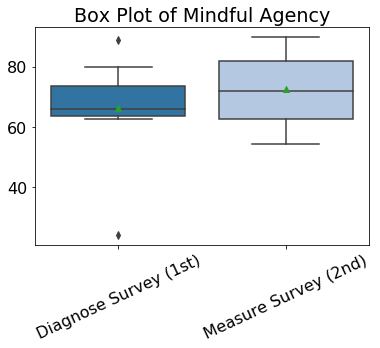

----------------------------------------------------------------------------------------------------


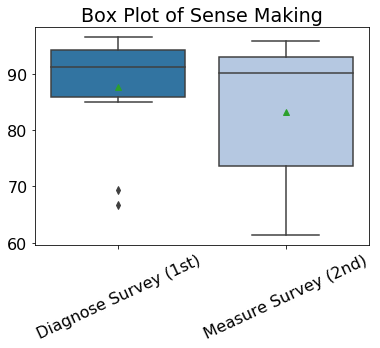

----------------------------------------------------------------------------------------------------


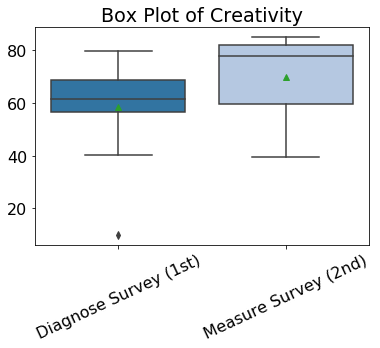

----------------------------------------------------------------------------------------------------


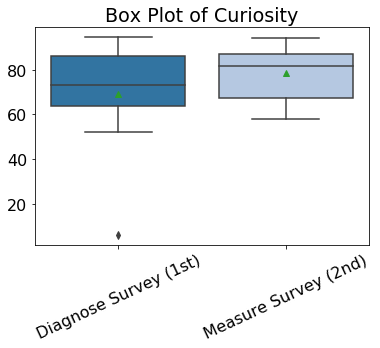

----------------------------------------------------------------------------------------------------


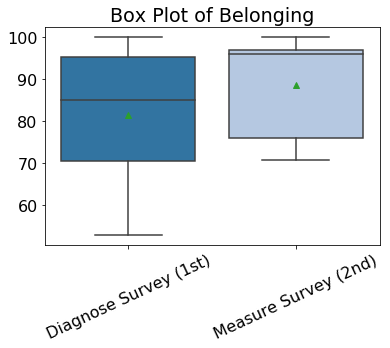

----------------------------------------------------------------------------------------------------


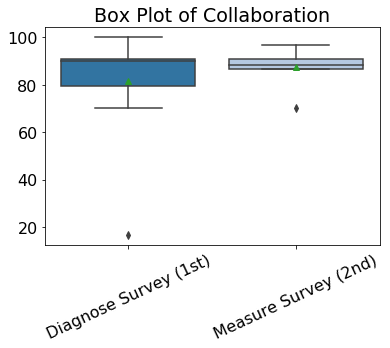

----------------------------------------------------------------------------------------------------


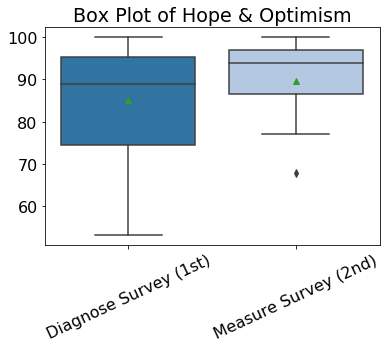

----------------------------------------------------------------------------------------------------


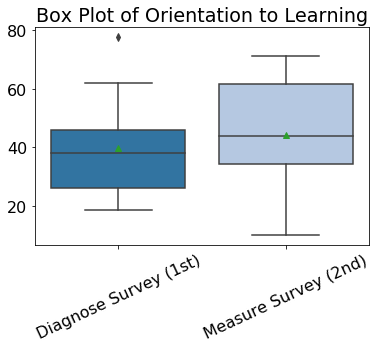

----------------------------------------------------------------------------------------------------


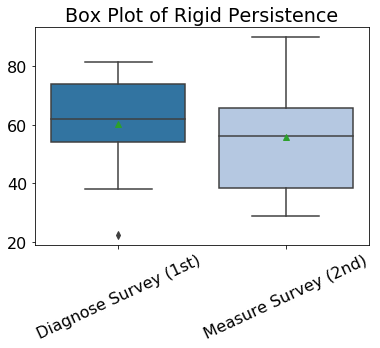

----------------------------------------------------------------------------------------------------


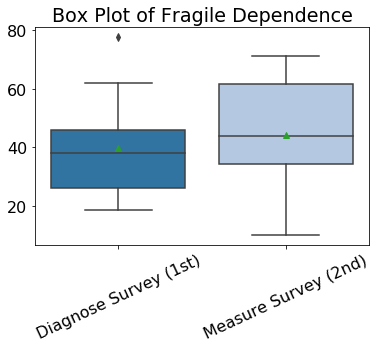

----------------------------------------------------------------------------------------------------


In [29]:
# create a list of columns that the loop will work through
columns = [
    'Mindful Agency', 'Sense Making', 'Creativity', 'Curiosity', 'Belonging',
    'Collaboration', 'Hope & Optimism', 'Orientation to Learning',
    'Rigid Persistence', 'Fragile Dependence'
]

for yaxis in columns:
    comparisonBoxplots(
        dfBoxplot['Summary'],
        dfBoxplot[yaxis],
        palette=[my_colors[0], my_colors[1]],
        title="Box Plot of " + yaxis)

In [30]:
#group by splits the data into two parts and this is used by plot to create two charts

# just wanted the columns to plot
dfBoxplotSideBySide = dfBoxplot[[
    'Mindful Agency',
    'Sense Making',
    'Creativity',
    'Curiosity',
    'Belonging',
    'Collaboration',
    'Hope & Optimism',
    'Orientation to Learning',
    'Summary',
    # 'Rigid Persistence', 'Fragile Dependence'
]].copy()

dfBoxplotSideBySide = dfBoxplotSideBySide.groupby('Summary')

In [31]:
# this code prints out the values created by running the groupby command
if verbose:
    for name_of_the_group, group in dfBoxplotSideBySide:
        print(name_of_the_group)
        print(group)

Diagnose Survey (1st)
    Mindful Agency  Sense Making  Creativity  Curiosity  Belonging  \
0   88.86           90.44         79.88       86.86      100.00      
1   70.16           94.34         57.60       73.60      63.34       
2   73.24           96.60         59.68       86.18      85.54       
3   65.40           86.28         64.12       73.02      95.94       
4   64.60           94.58         74.72       69.30      95.06       
5   63.84           93.18         72.36       52.36      74.70       
6   24.24           92.14         10.00       6.32       100.00      
7   62.56           66.62         54.12       57.74      52.78       
8   75.00           69.32         67.50       86.02      72.12       
9   79.74           95.90         63.10       94.48      65.46       
10  66.12           87.26         40.30       65.74      87.82       
11  62.98           85.06         58.02       80.08      84.66       

    Collaboration  Hope & Optimism  Orientation to Learning  \
0   

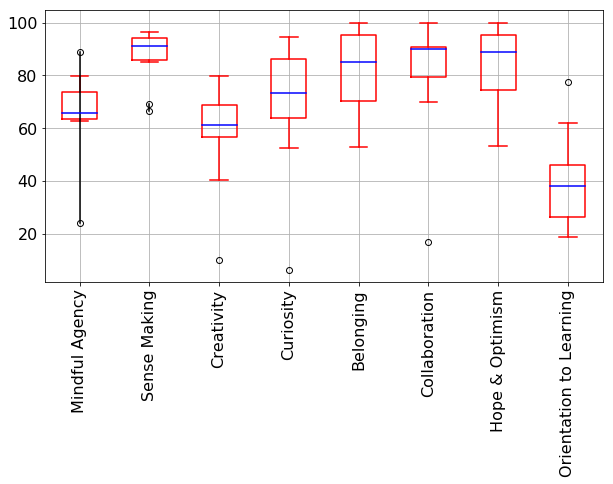

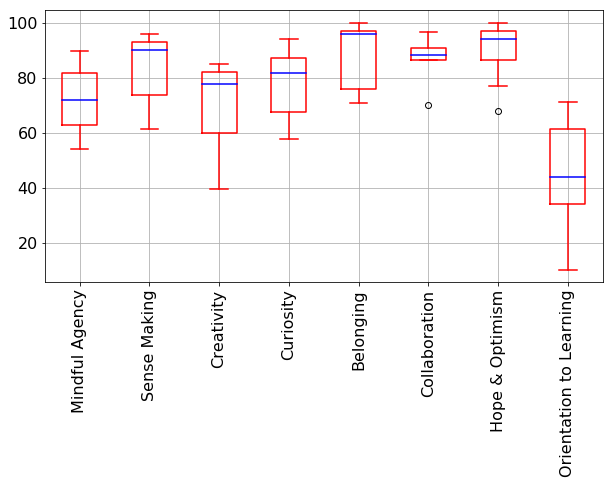

In [32]:
ax = dfBoxplotSideBySide.plot(
    kind='box',
    # sym='k.',  # symbol used to plot outliers
    subplots=False,
    figsize=(10, 5),
    color=dict(boxes='r', whiskers='r', medians='b', caps='r'),
    boxprops=dict(linestyle='-', linewidth=1.5),
    flierprops=dict(linestyle='-', linewidth=1.5),
    medianprops=dict(linestyle='-', linewidth=1.5),
    whiskerprops=dict(linestyle='-', linewidth=1.5),
    capprops=dict(linestyle='-', linewidth=1.5),
    showfliers=True,
    grid=True,
    rot=90)
# ax.set_xlabel('Diagnose Survey (1st)')
# ax.set_ylabel('Bar in X')

plt.show()

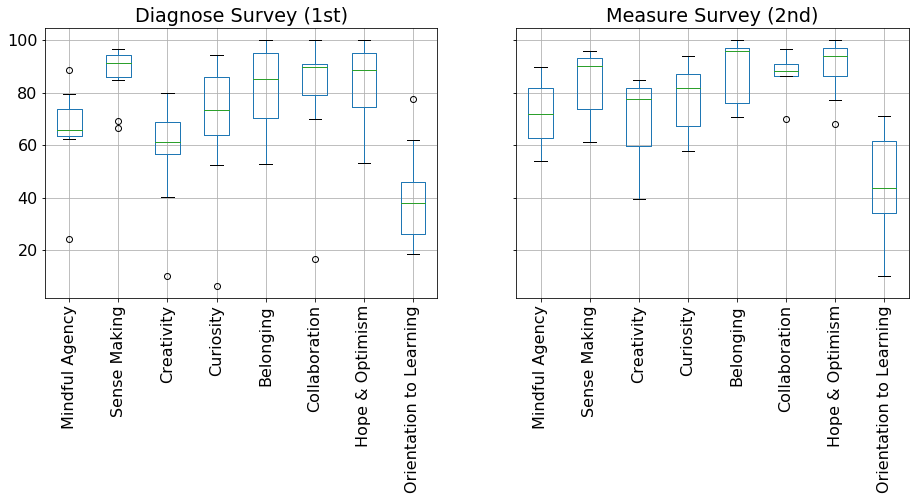

In [33]:
ax = dfBoxplotSideBySide.boxplot(

    # sym='k.',  # symbol used to plot outliers
    subplots=True,
    figsize=(15, 5),
    showfliers=True,
    grid=True,
    rot=90)
# ax.set_xlabel('Diagnose Survey (1st)')
# ax.set_ylabel('Bar in X')

plt.show()

In [34]:
# remove the variable
if cleanUp:
    del dfBoxplotSideBySide

## Side by Side Boxplot Comparison

In [35]:
# copy the data to a new df
dfBoxplotCombined = dfBoxplot.copy()

# drop the uneeded columns
dfBoxplotCombined.drop(['userPrimaryEmail', 'Student Index', 'completedSecondSurvey'],
               axis=1,
               inplace=True,
               errors='ignore')

if verbose:
    print(dfBoxplotCombined.columns)
    print(dfBoxplotCombined.shape)

Index(['Mindful Agency', 'Sense Making', 'Creativity', 'Curiosity',
       'Belonging', 'Collaboration', 'Hope & Optimism',
       'Orientation to Learning', 'Rigid Persistence', 'Fragile Dependence',
       'Summary'],
      dtype='object')
(24, 11)


In [36]:
# create a new data structure to hold the values to plot. 
dfBoxPlotMelt = dfBoxplotCombined.melt(
    id_vars='Summary',
    value_vars=[
        'Mindful Agency', 'Sense Making', 'Creativity', 'Curiosity',
        'Belonging', 'Collaboration', 'Hope & Optimism',
        'Orientation to Learning', 'Rigid Persistence', 'Fragile Dependence'
    ],
    var_name='columns')

if verbose:
    dfBoxPlotMelt.shape

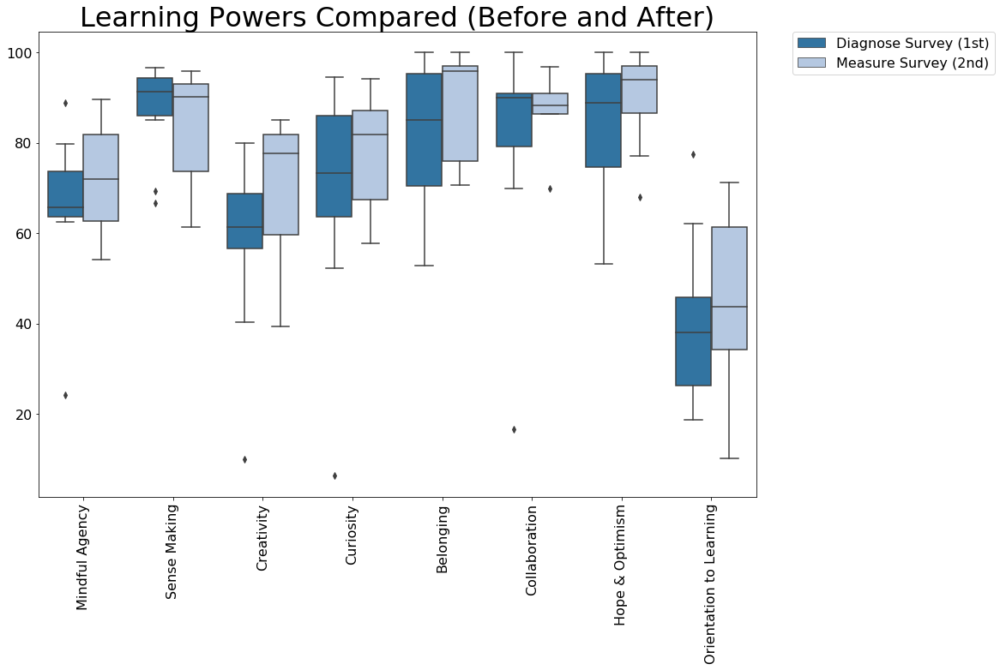

In [37]:
# set the plot size
fig, a = plt.subplots(figsize=bplFigSize)

# create the chart
a = sns.boxplot(
    data=dfBoxPlotMelt,
    hue='Summary',  # different colors for different 'cls'
    x='columns',  # defined above 
    y='value',
    order=[  # custom order of boxplots
        'Mindful Agency', 'Sense Making', 'Creativity', 'Curiosity',
        'Belonging', 'Collaboration', 'Hope & Optimism',
        'Orientation to Learning'
    ],
    palette=['#1F77B4', '#AEC7E8'])

# set the labels on the individual x-axis columns
a.set_xticklabels(labels=a.get_xticklabels(), rotation=90)

# set the ledgend box to be top right
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# set the title of the chart
plt.title('Learning Powers Compared (Before and After)', fontsize=fontTitle)

# set the labels - x  is blank because we don't need it to say "Summary"
a.set(xlabel="", ylabel="")

plt.show()

In [38]:
# clean up objectgs no longer needed
if cleanUp:
    del dfBoxPlotMelt, dfBoxplotCombined, dfBoxplot

# Combined Radar Chart 
This shows all the students on the one chart for the first survey

## Combined Radar Chart  - Survey 1
This shows all the students on the one chart for the first survey

In [39]:
# Make a subset of the data so it is easier to work with
dfRadar = df[[
    analyse_variable, 'Mindful Agency', 'Sense Making', 'Creativity',
    'Curiosity', 'Hope & Optimism', 'Belonging', 'Collaboration',
    'Orientation to Learning'
]].copy()

# generate the list of colours for the chart
lstColour = chartColour(df[analyse_variable], dctChartColours)

In [40]:
# Calculate the total sample size. This is used to calc the sample size % on the chart
# just counting rows
sampletotal = len(dfRadar.index)
if verbose:
    display(sampletotal)

12

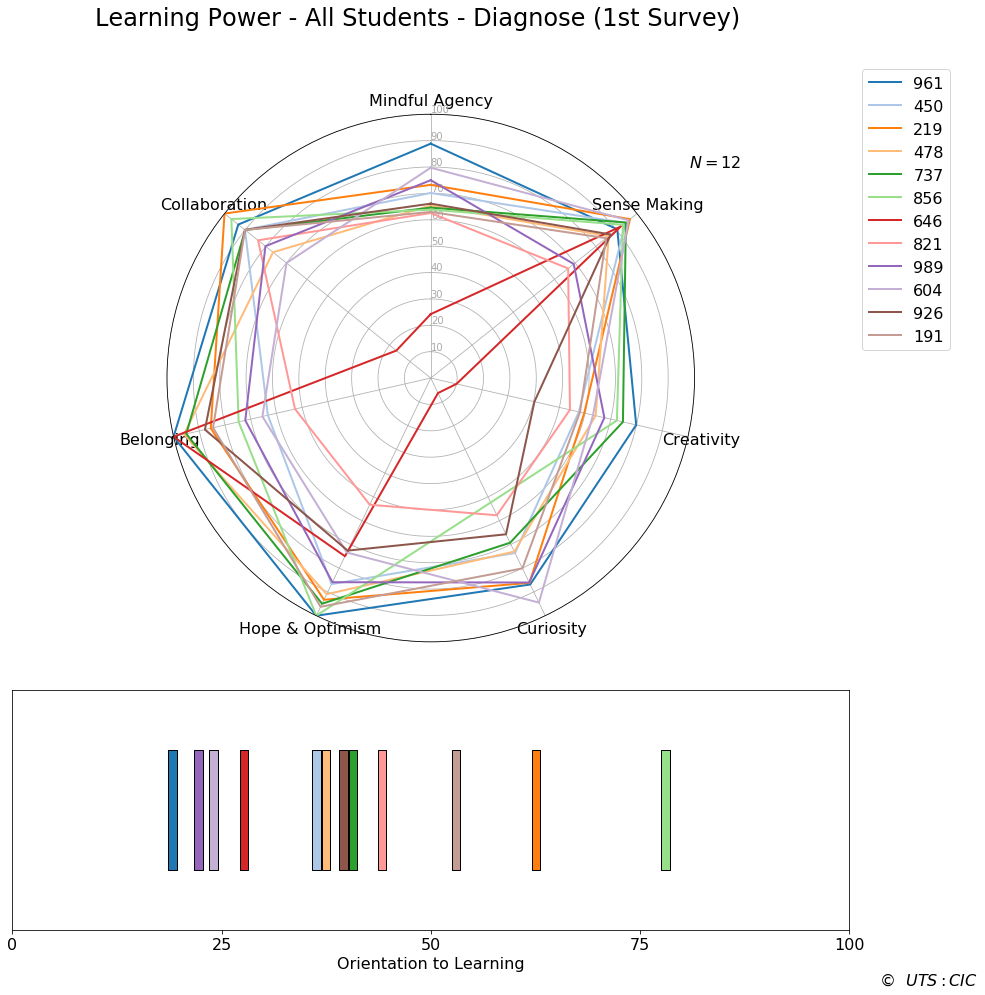

----------------------------------------------------------------------------------------------------


In [41]:
# calll the function passing the correct df to it
title = 'Learning Power - All Students - Diagnose (1st Survey)'
combinedCharts(dfRadar, analyse_variable, sampletotal, title, lstColour)

## Combined Radar Chart  - Survey 2
This shows all the students on the one chart for the second survey

In [42]:
# Make a subset of the data so it is easier to work with
dfRadar = df2ndSurveyResults[[
    analyse_variable, 'Mindful Agency 2', 'Sense Making 2', 'Creativity 2',
    'Curiosity 2', 'Hope & Optimism 2', 'Belonging 2', 'Collaboration 2',
    'Orientation to Learning 2'
]].copy()


# generate the list of colours for the chart
lstColour = chartColour(df[analyse_variable], dctChartColours)

In [43]:
# Calculate the total sample size. This is used to calc the sample size % on the chart
# just counting rows
sampletotal = len(dfRadar.index)
if verbose:
    display(sampletotal)

8

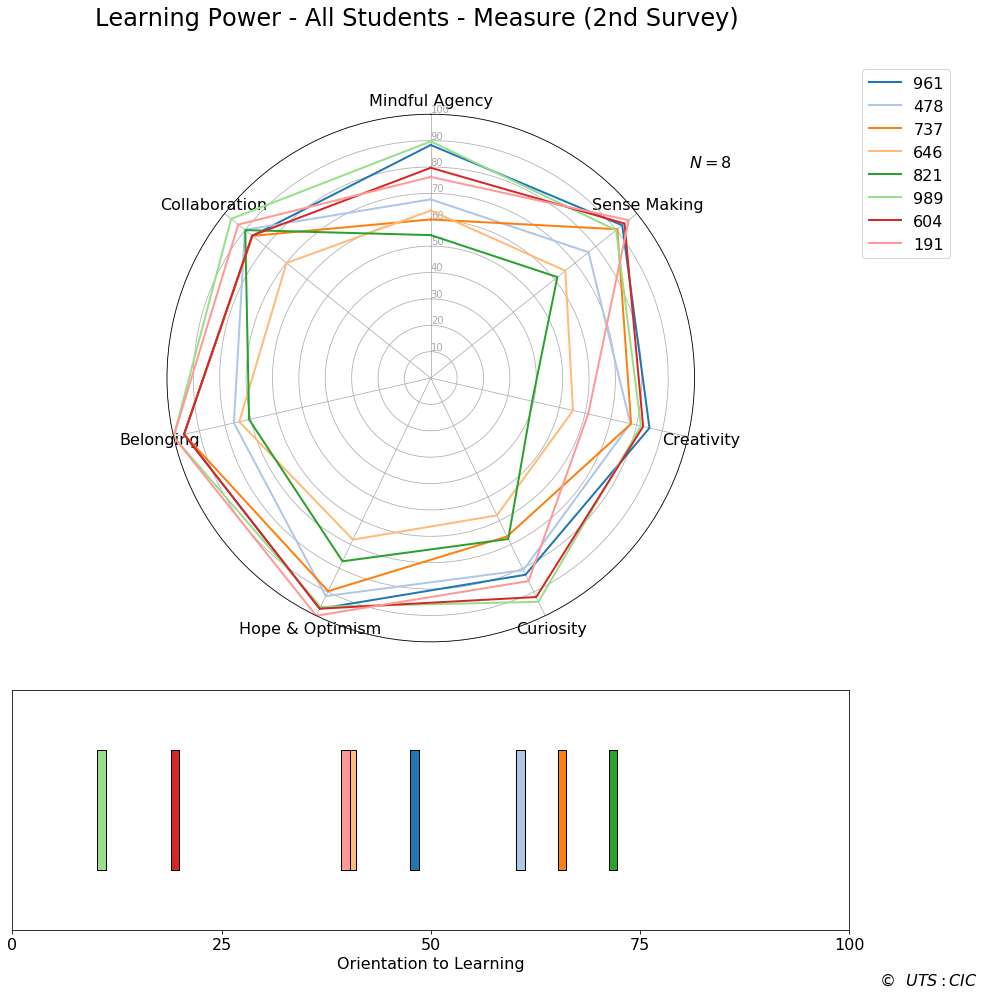

----------------------------------------------------------------------------------------------------


In [44]:
title = 'Learning Power - All Students - Measure (2nd Survey)'
combinedCharts(dfRadar, analyse_variable, sampletotal, title, lstColour)

## Individual Radar Chart 1 
This shows each students chart for the first survey

In [45]:
# temp DF to hold the columns to be passed into the function
dfChart = df[[
    analyse_variable, 'Mindful Agency', 'Sense Making', 'Creativity',
    'Curiosity', 'Hope & Optimism', 'Belonging', 'Collaboration',
    'Orientation to Learning'
]]

# generate the list of colours for the chart
lstColour = chartColour(df[analyse_variable], dctChartColours)

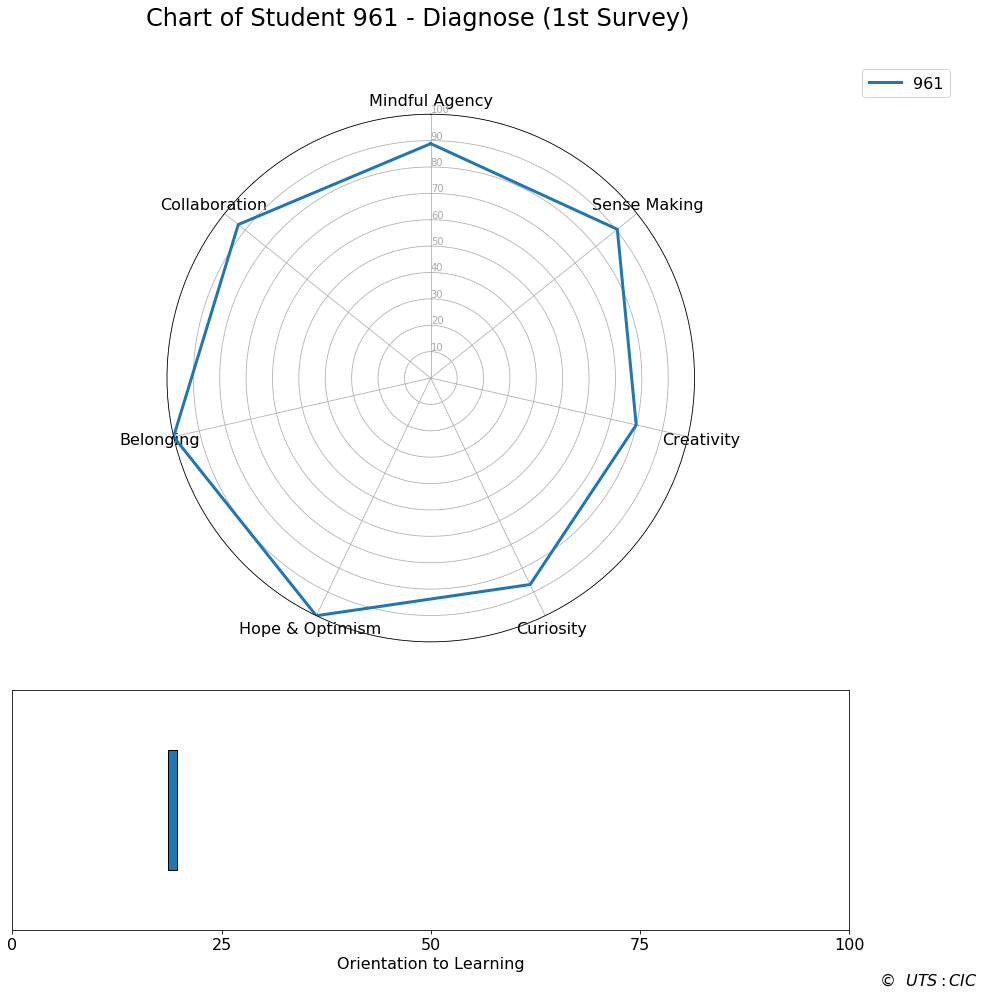

----------------------------------------------------------------------------------------------------


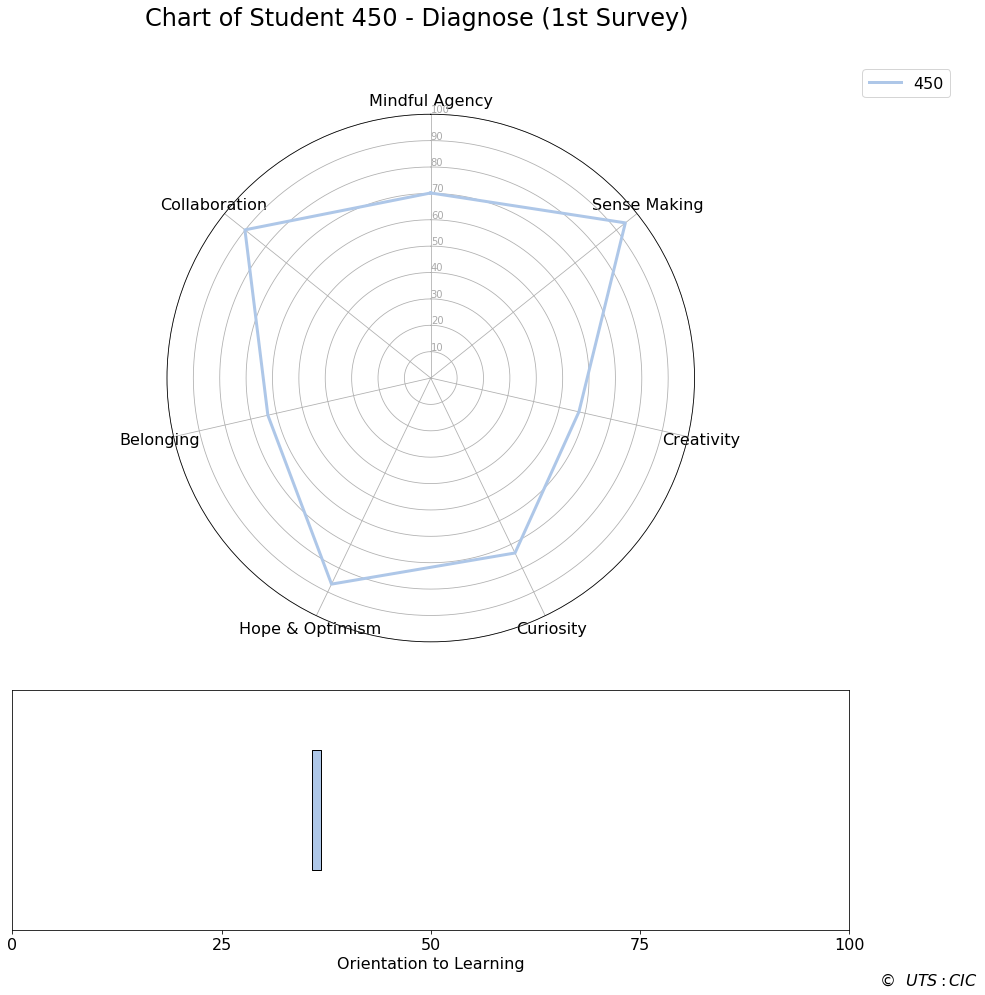

----------------------------------------------------------------------------------------------------


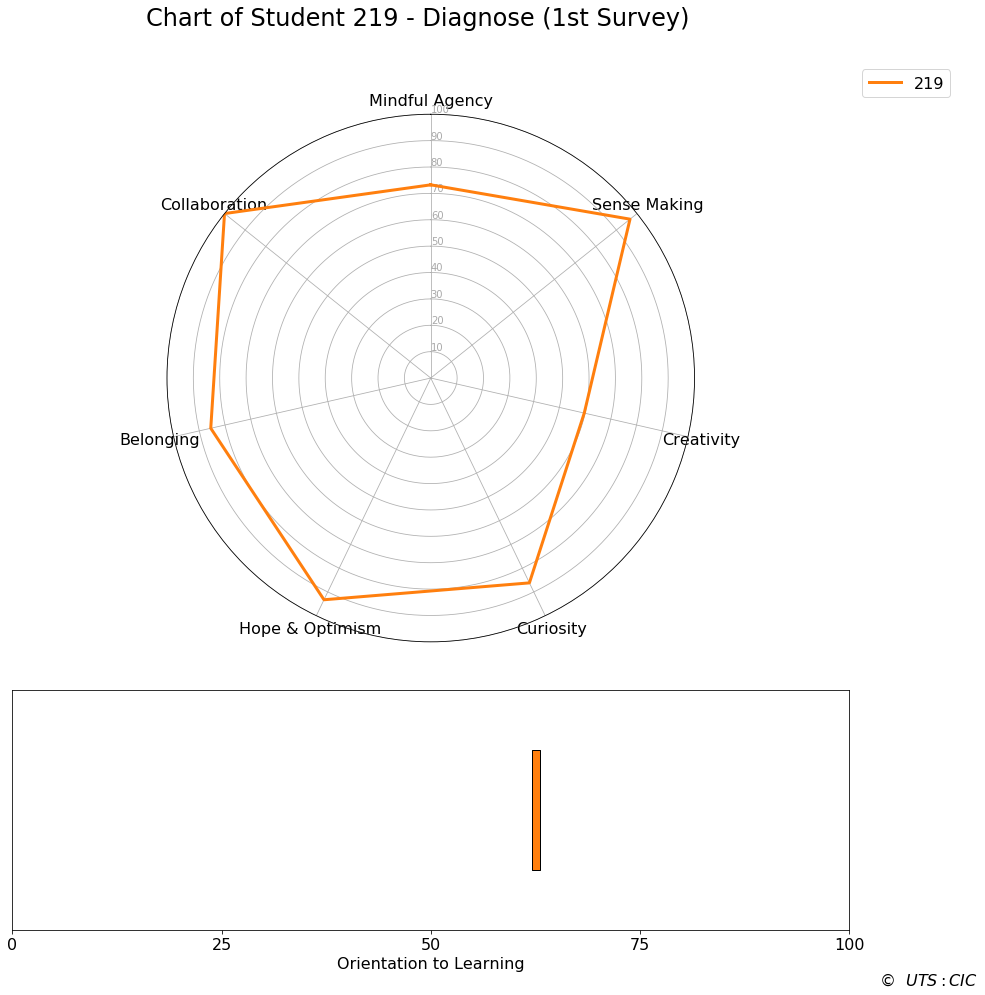

----------------------------------------------------------------------------------------------------


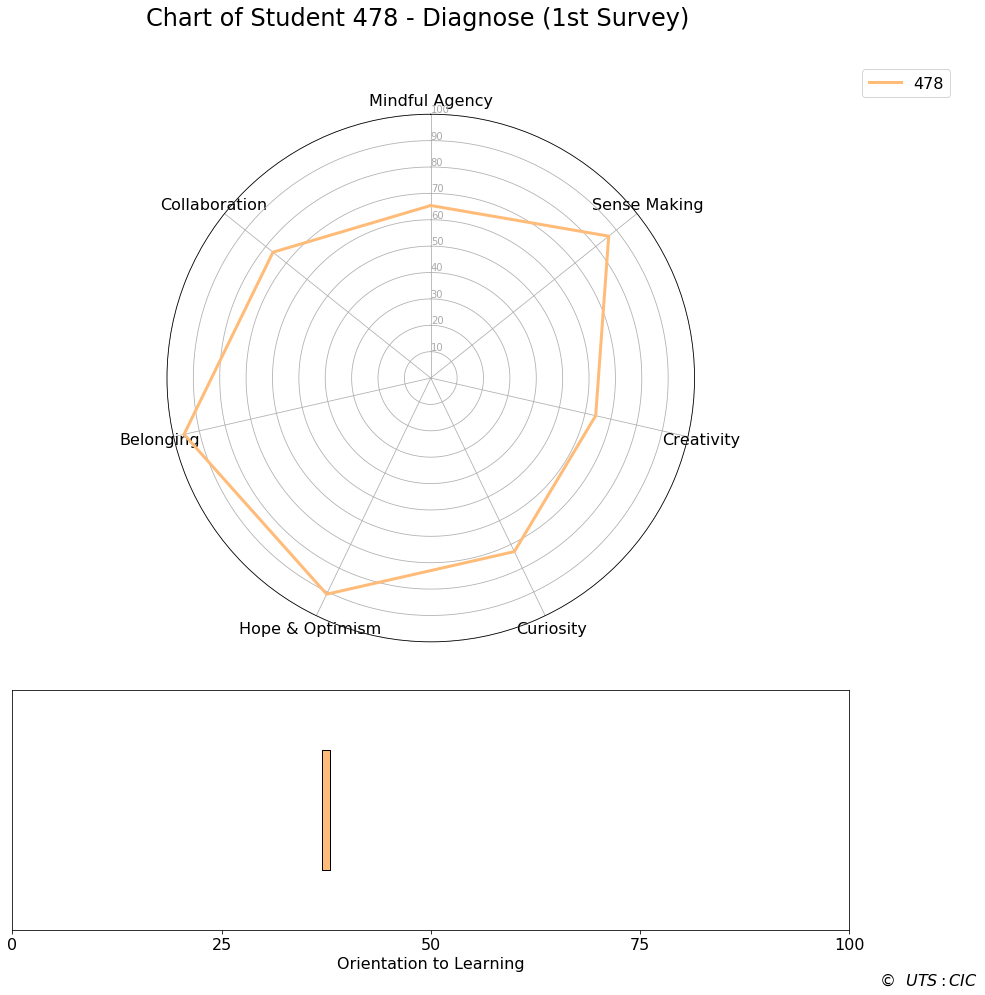

----------------------------------------------------------------------------------------------------


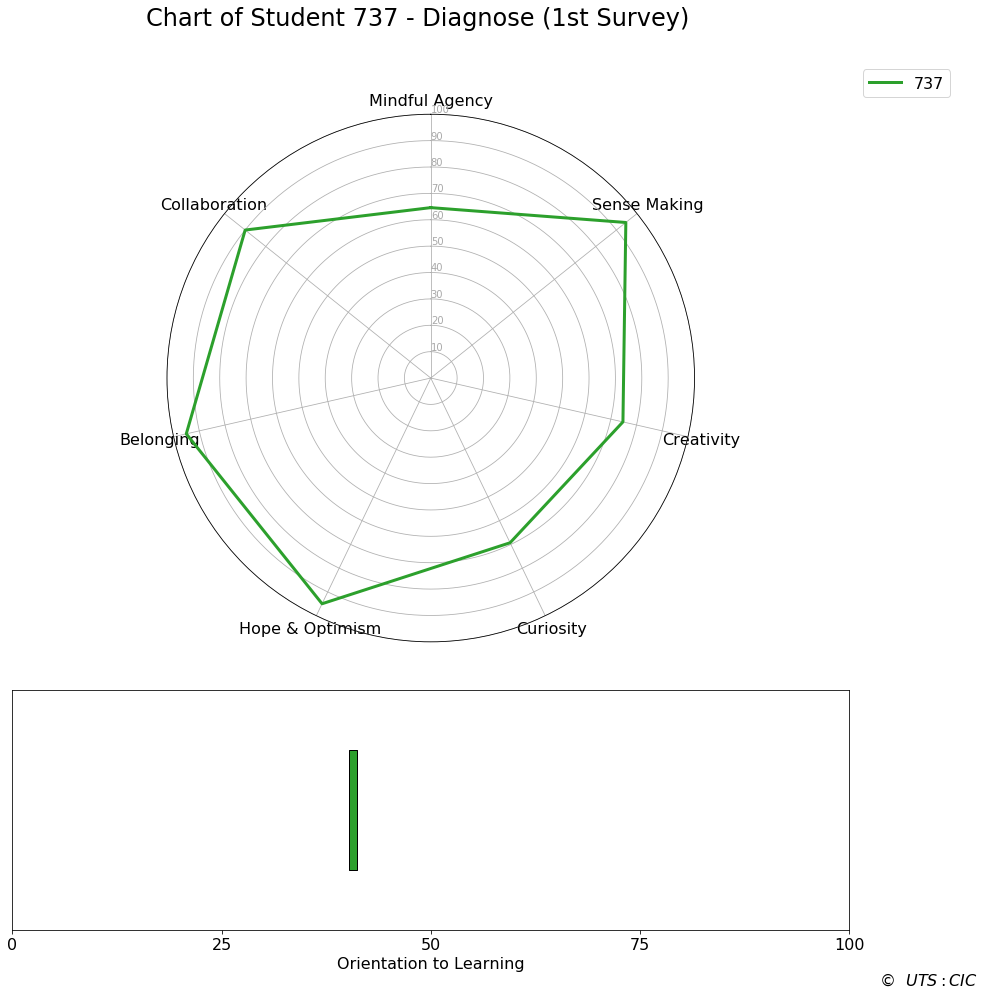

----------------------------------------------------------------------------------------------------


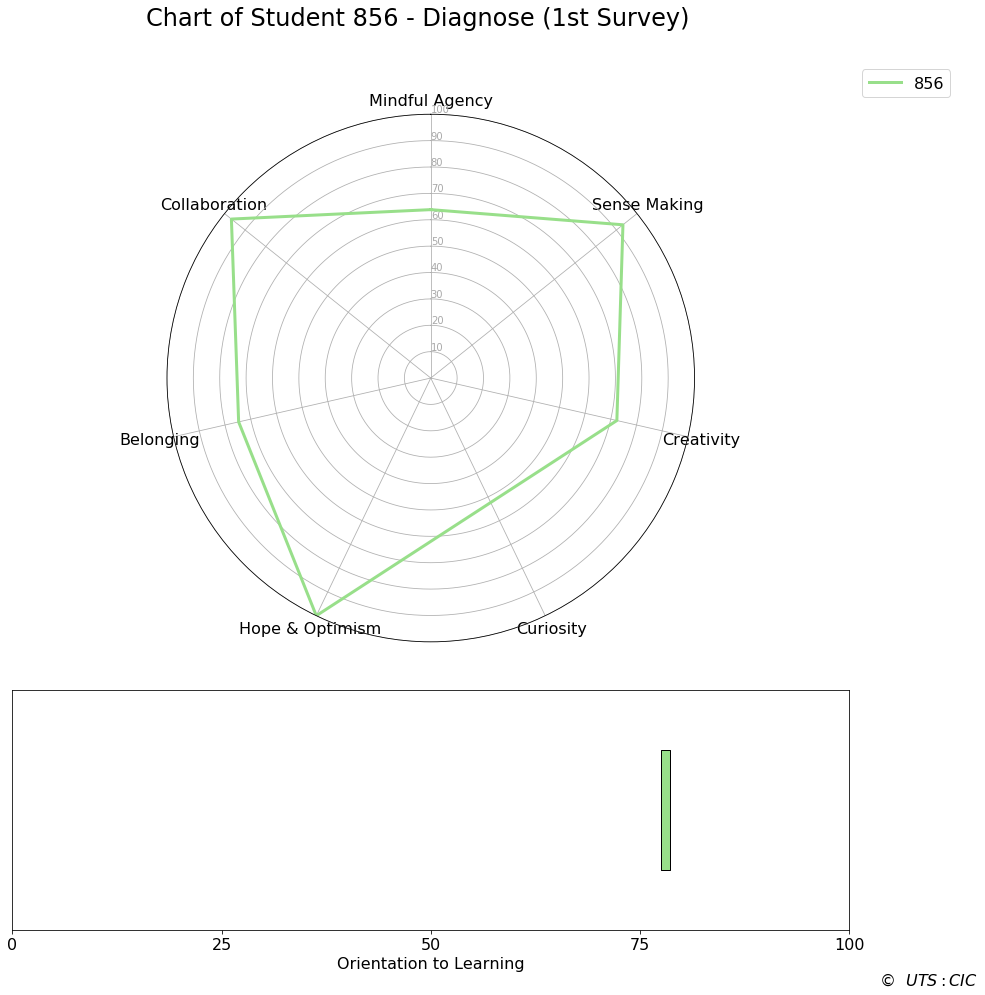

----------------------------------------------------------------------------------------------------


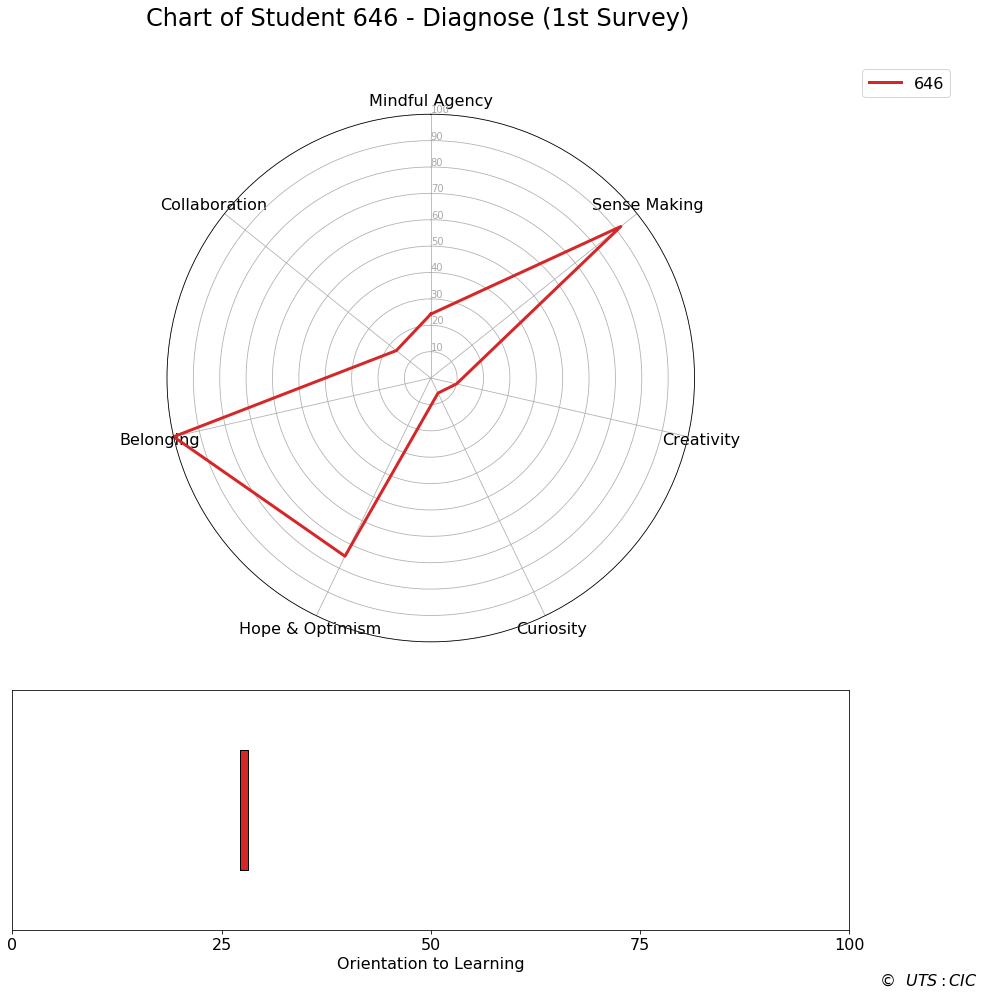

----------------------------------------------------------------------------------------------------


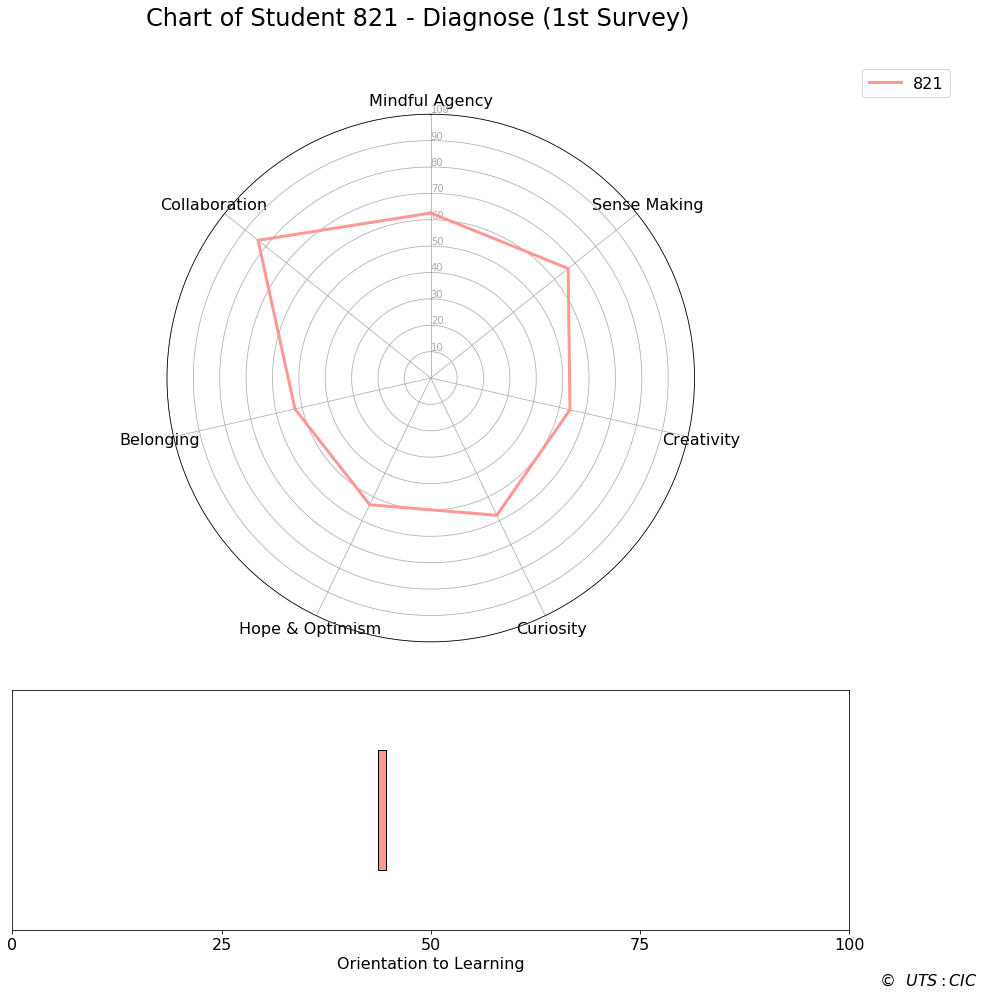

----------------------------------------------------------------------------------------------------


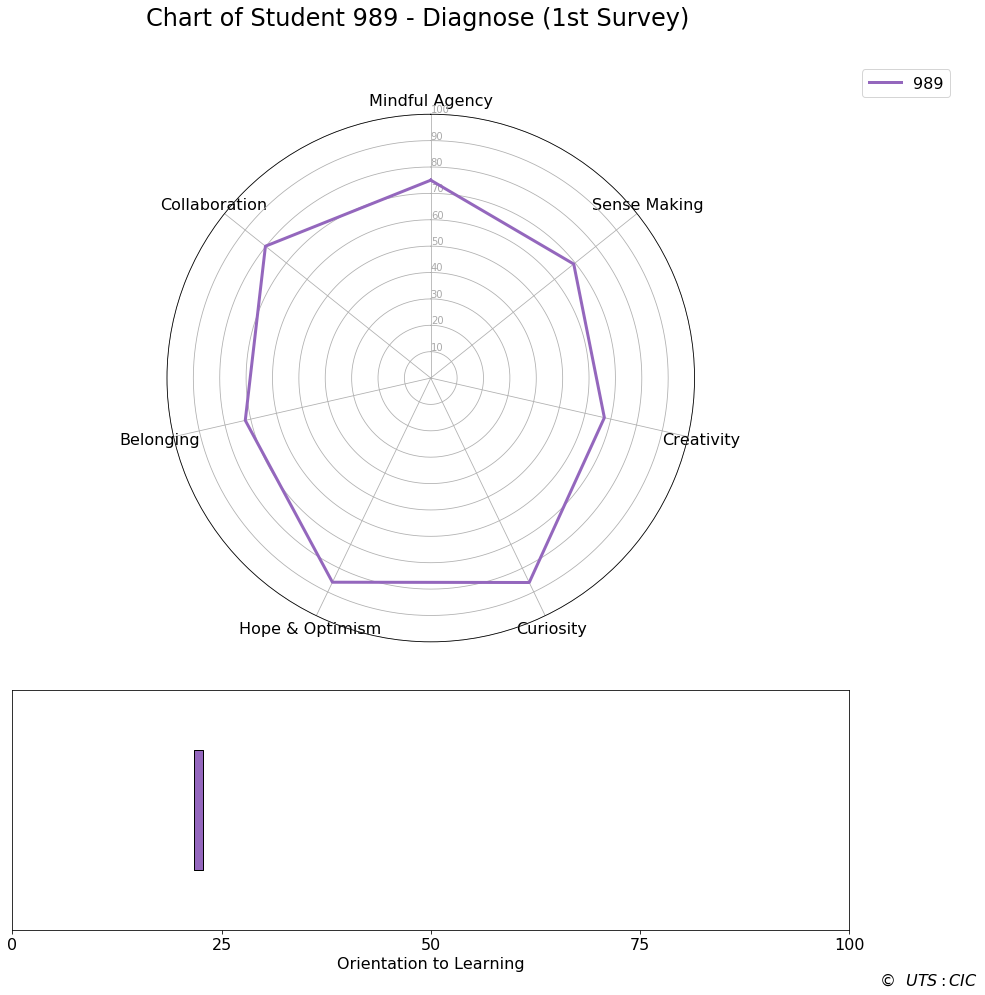

----------------------------------------------------------------------------------------------------


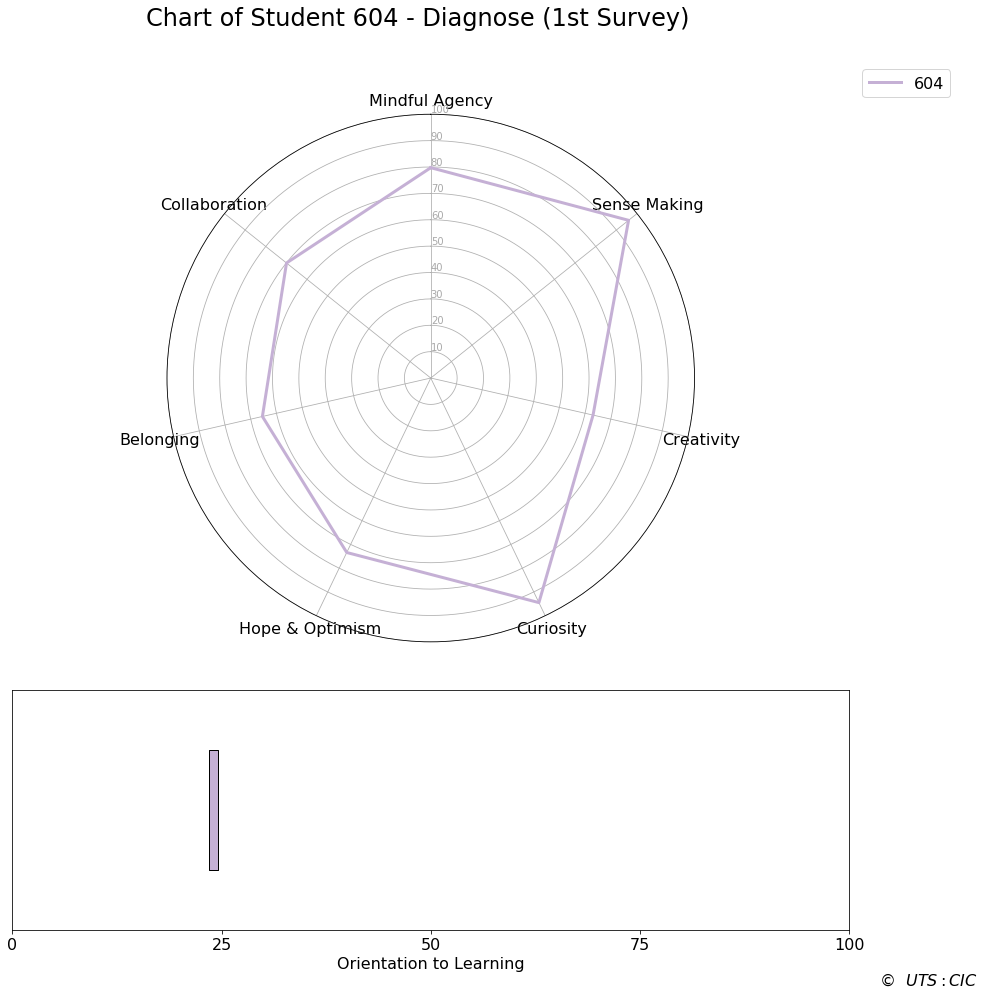

----------------------------------------------------------------------------------------------------


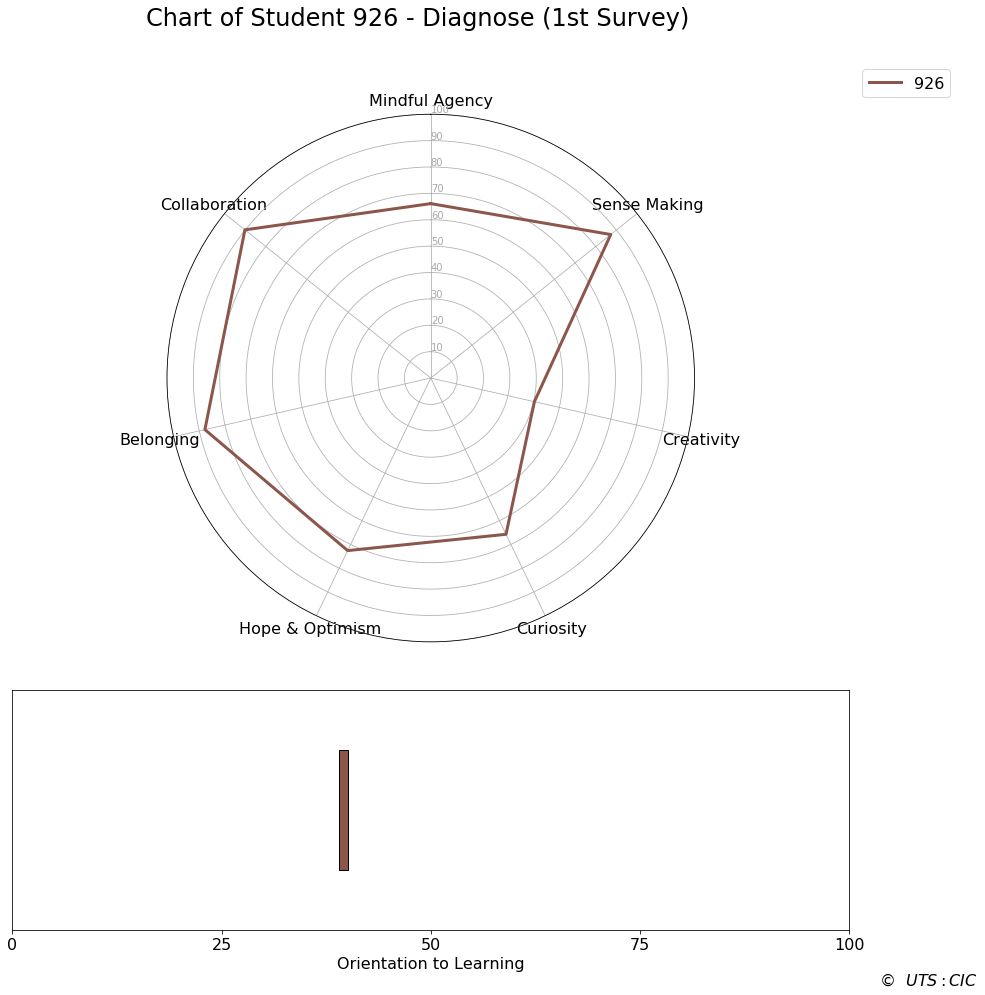

----------------------------------------------------------------------------------------------------


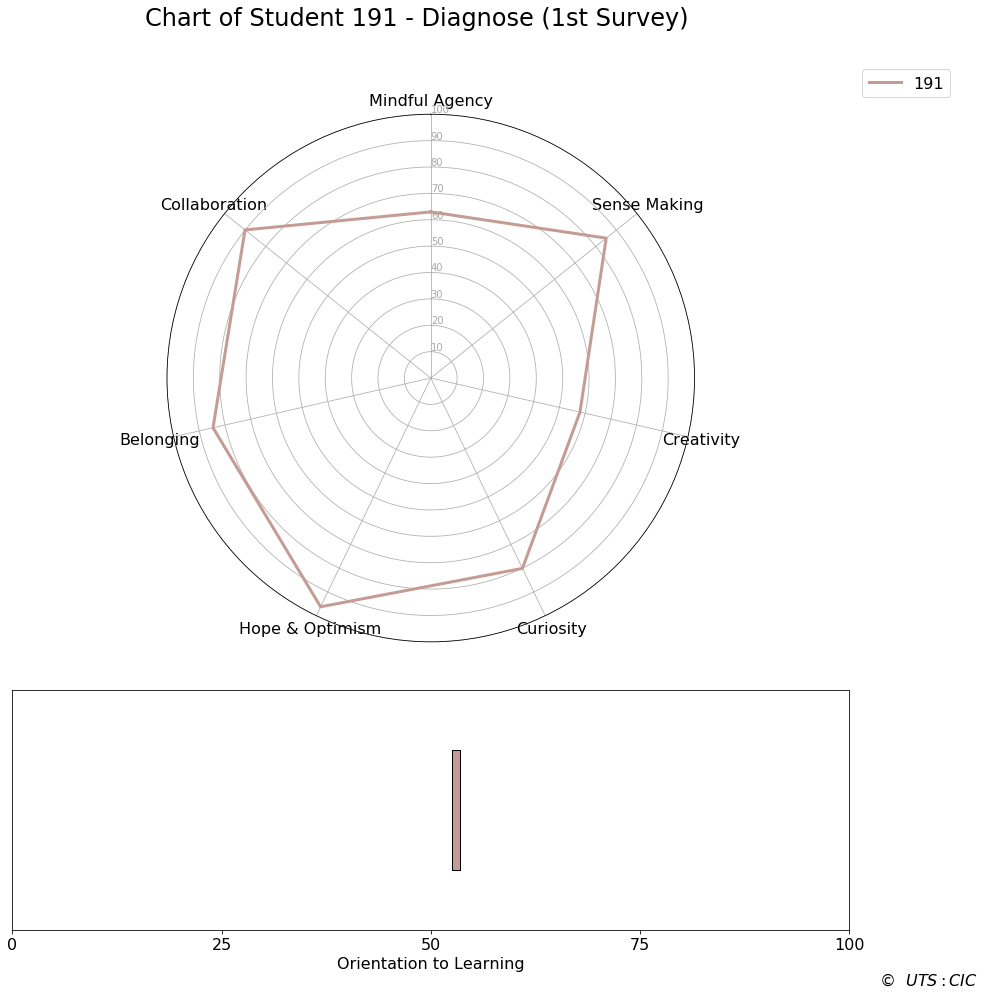

----------------------------------------------------------------------------------------------------


In [46]:
# call the function to create this list of charts for the Diagnose Survey
title = ' - Diagnose (1st Survey)'
individualCharts(dfChart, analyse_variable, title, lstColour)

## Individual Radar Chart 2
This shows each students chart for the second survey

In [47]:
# temp DF to hold the columns to be passed into the function
# need a copy otherwise the next step has a kitten
dfChart = df[[
    analyse_variable, 'Mindful Agency 2', 'Sense Making 2', 'Creativity 2',
    'Curiosity 2', 'Hope & Optimism 2', 'Belonging 2', 'Collaboration 2',
    'Orientation to Learning 2'
]].copy()


In [48]:
# remove the empty records
dfChart.dropna(axis='index', how='any', inplace=True)
# reset the index
dfChart.reset_index(drop=True, inplace=True)

# generate the list of colours for the chart
lstColour = chartColour(dfChart['Student Index'], dctChartColours)

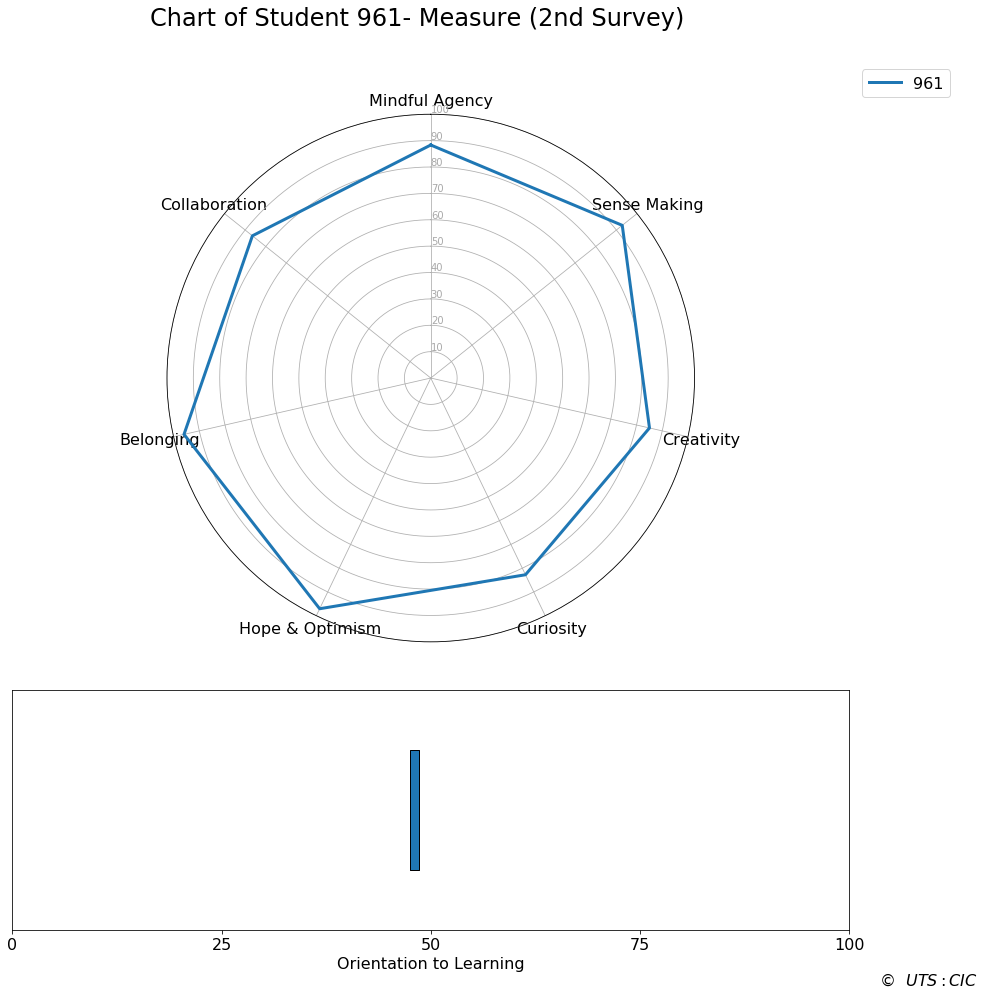

----------------------------------------------------------------------------------------------------


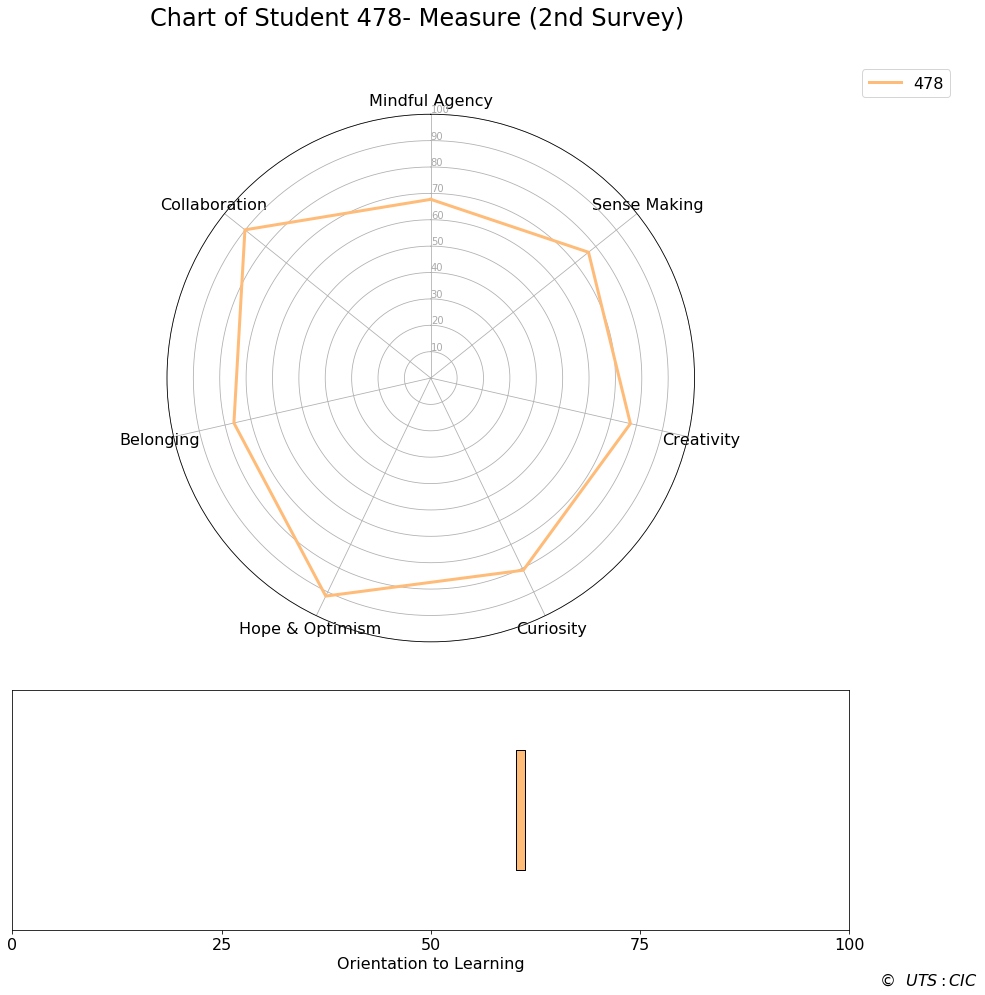

----------------------------------------------------------------------------------------------------


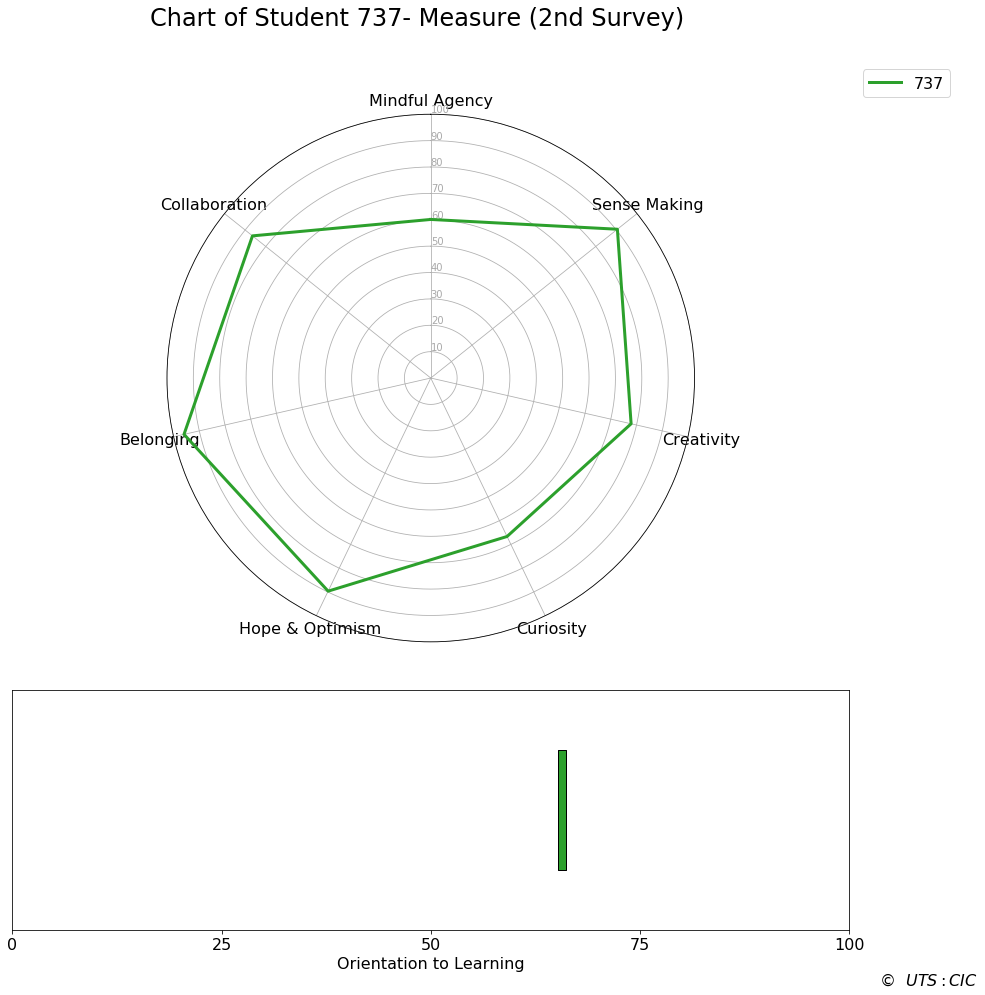

----------------------------------------------------------------------------------------------------


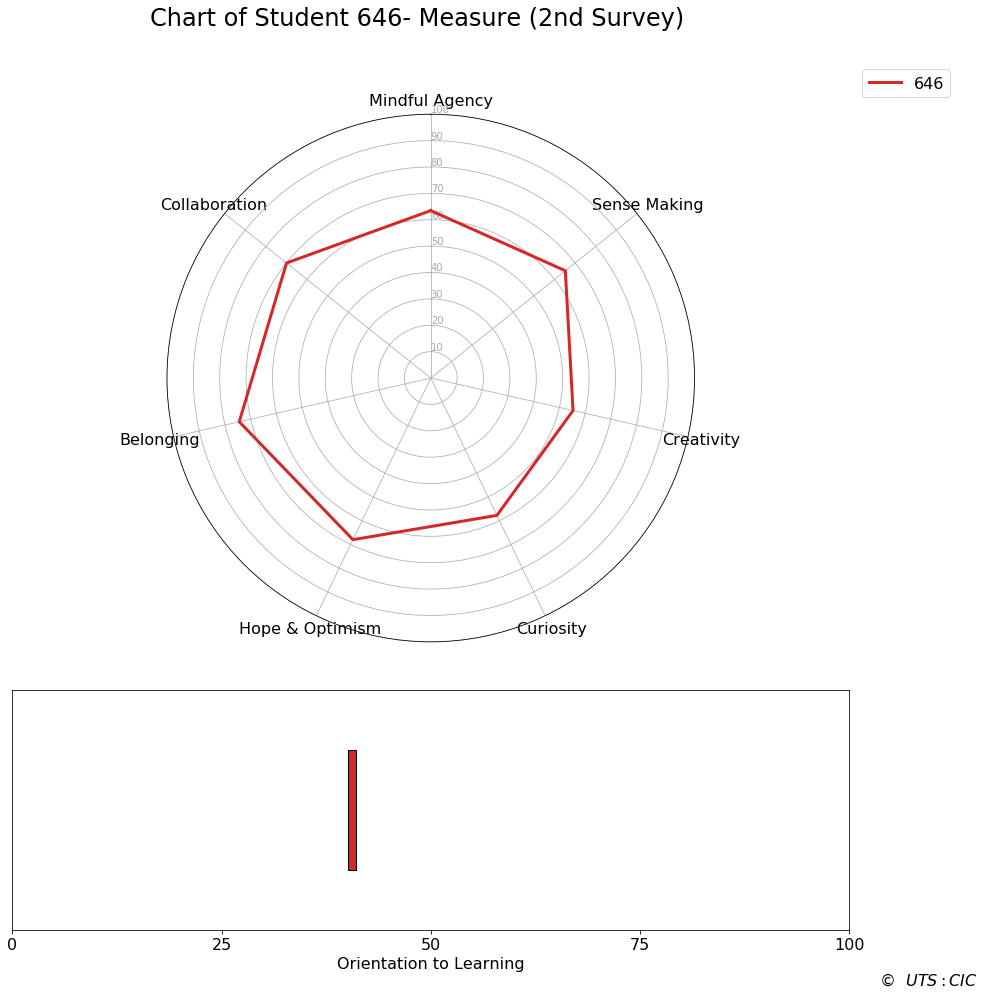

----------------------------------------------------------------------------------------------------


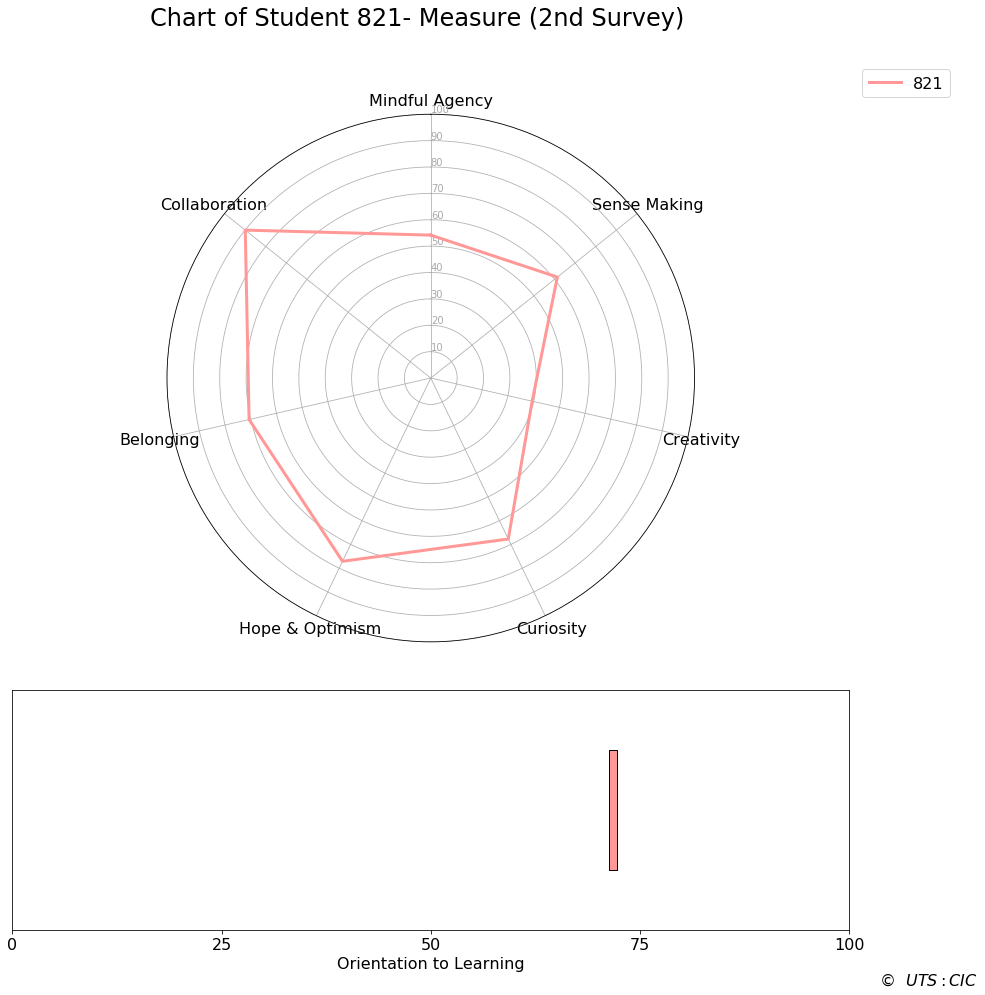

----------------------------------------------------------------------------------------------------


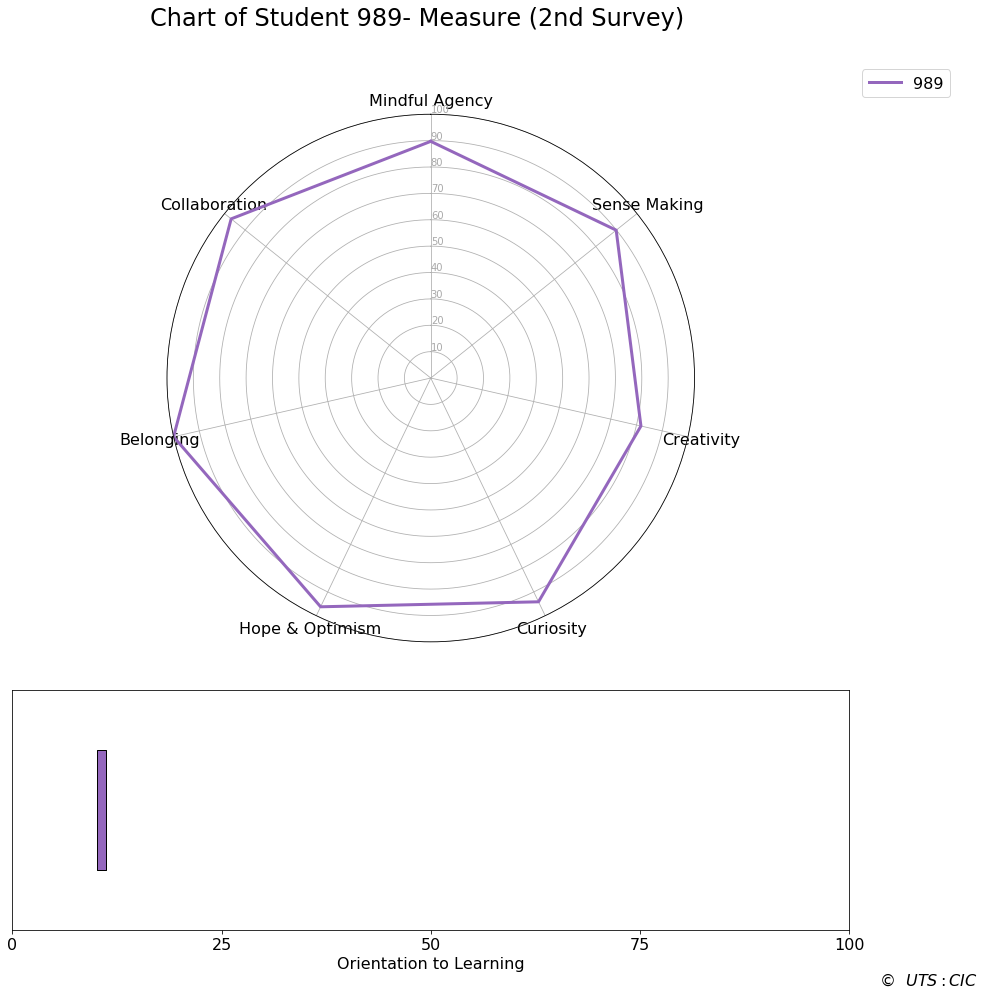

----------------------------------------------------------------------------------------------------


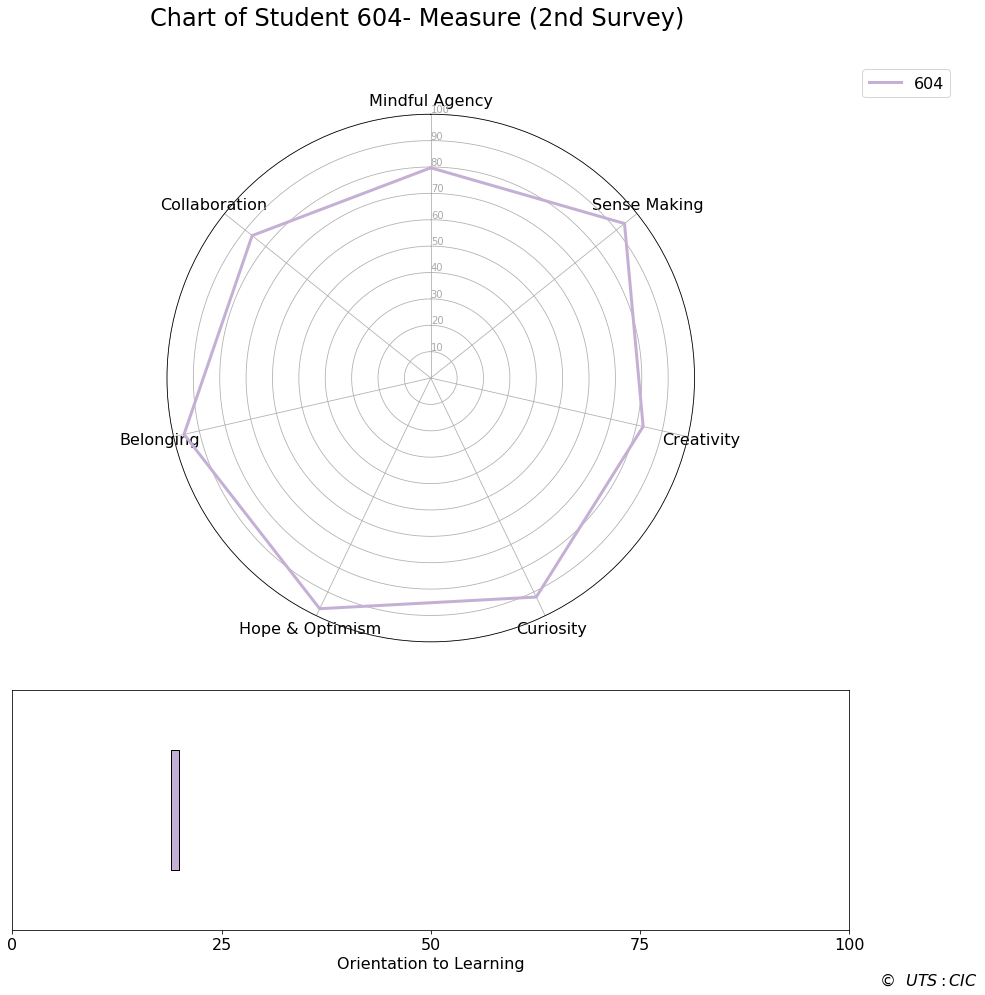

----------------------------------------------------------------------------------------------------


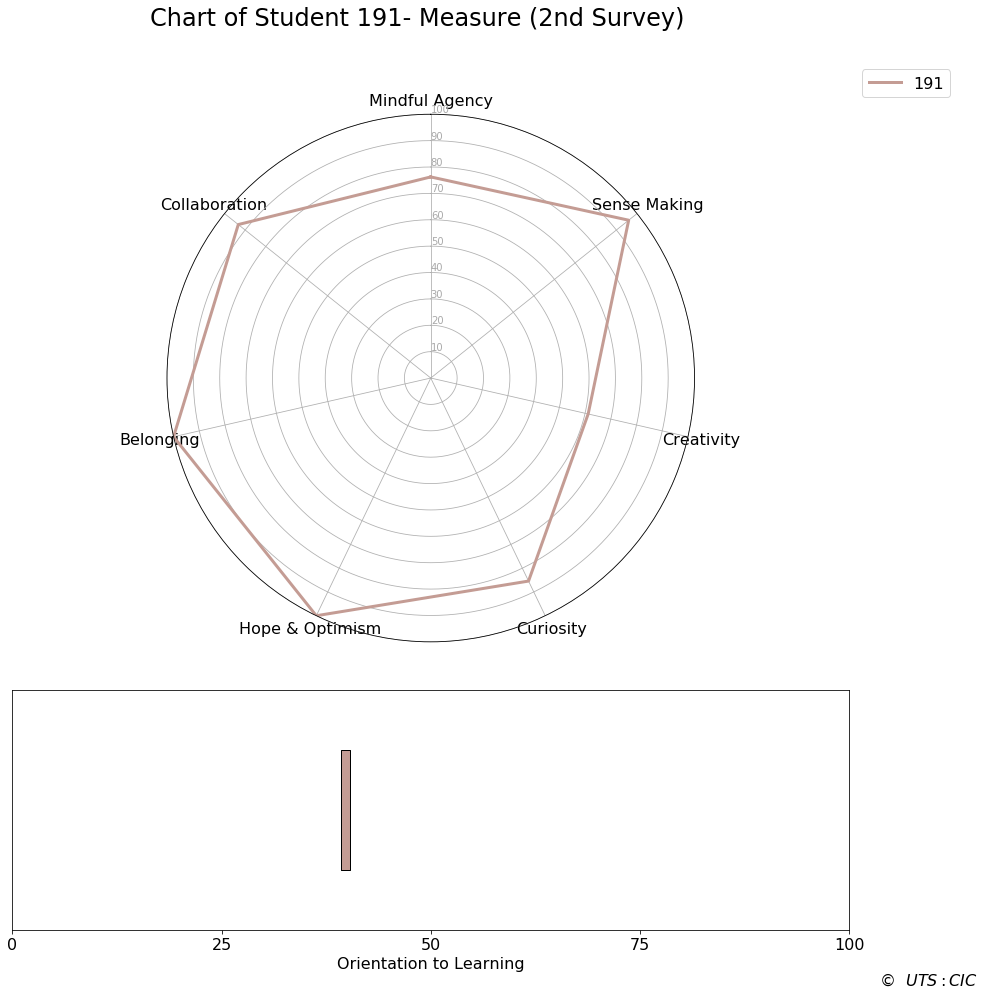

----------------------------------------------------------------------------------------------------


In [49]:
# call the function to create this list of charts for the Diagnose Survey
title = '- Measure (2nd Survey)'
individualCharts(dfChart, analyse_variable, title, lstColour)

In [50]:
if cleanUp:
    del dfChart

## Parallel Coordinate Charts

### First survey

In [51]:
# create the df to pass to the function
dfParaCoord = df[[
    analyse_variable, 'Fragile Dependence', 'Mindful Agency', 'Sense Making',
    'Creativity', 'Curiosity', 'Hope & Optimism', 'Belonging', 'Collaboration',
    'Rigid Persistence'
]]
# rename the columns to be user friendly
dfParaCoord.columns = [
    analyse_variable, '1 Fragile Dependence', '2 Mindful Agency', '3 Sense Making',
    '4 Creativity', '5 Curiosity', '6 Hope & Optimism', '7 Belonging',
    '8 Collaboration', '9 Rigid Persistence'
]

# generate the list of colours for the chart
lstColour = chartColour(dfParaCoord[analyse_variable], dctChartColours)

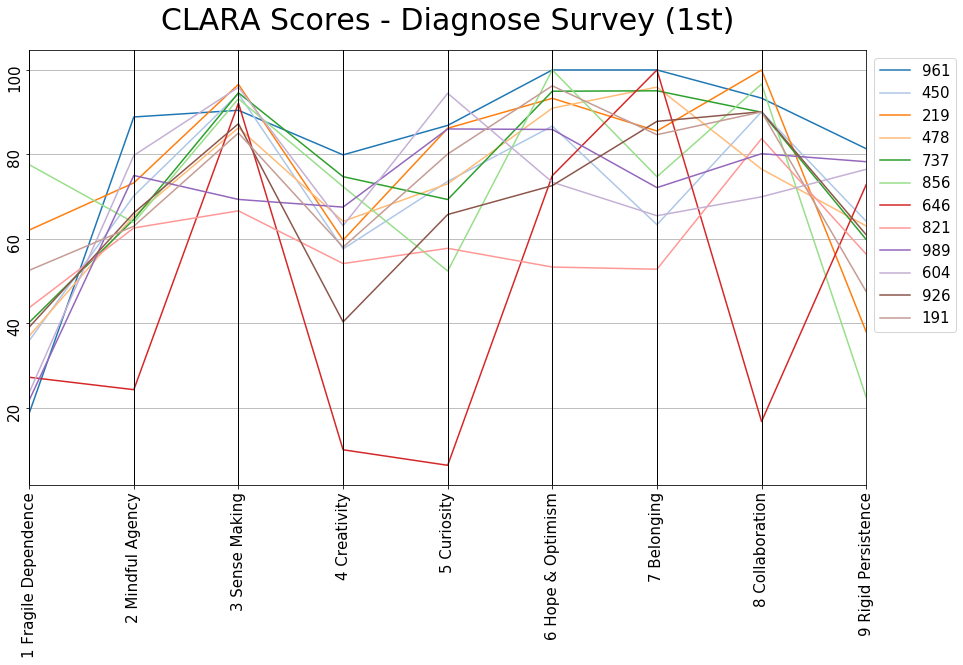

In [52]:
# plot the different columns as a parrllel coordinate chart
title = "CLARA Scores - Diagnose Survey (1st)"
parallelCoords(dfParaCoord, analyse_variable, lstColour, title)

### Second survey

In [53]:
# create the df to pass to the function
dfParaCoord = df[[
    analyse_variable, 'Fragile Dependence 2', 'Mindful Agency 2', 'Sense Making 2',
    'Creativity 2', 'Curiosity 2', 'Hope & Optimism 2', 'Belonging 2',
    'Collaboration 2', 'Rigid Persistence 2'
]]

# rename the columns to be user friendly
dfParaCoord.columns = [
    analyse_variable, '1 Fragile Dependence', '2 Mindful Agency', '3 Sense Making',
    '4 Creativity', '5 Curiosity', '6 Hope & Optimism', '7 Belonging',
    '8 Collaboration', '9 Rigid Persistence'
]

# generate the list of colours for the chart
lstColour = chartColour(dfParaCoord[analyse_variable], dctChartColours)

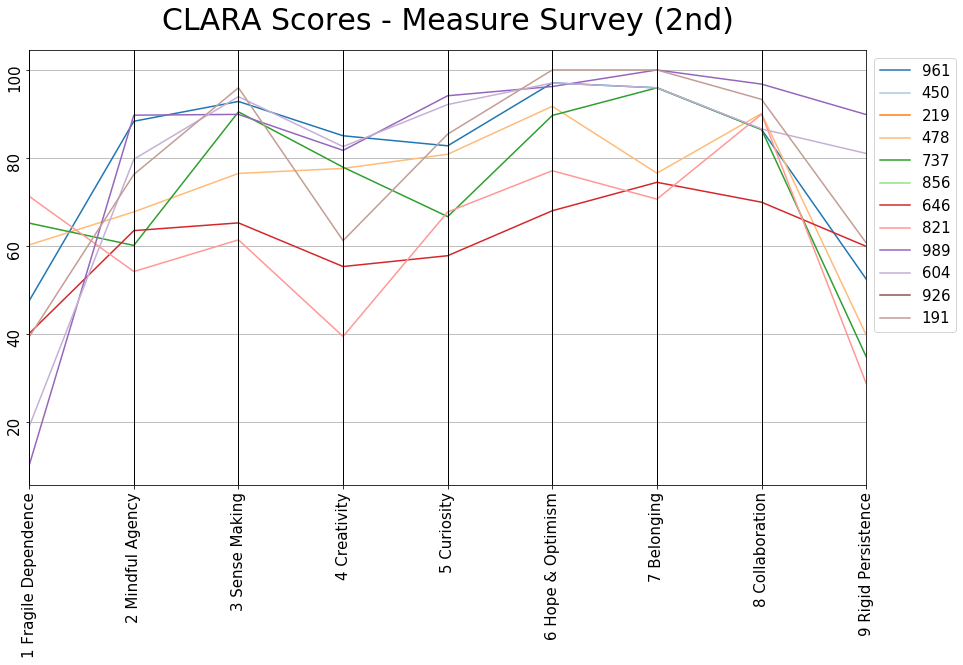

In [54]:
# plot the different columns as a parrllel coordinate chart
title = "CLARA Scores - Measure Survey (2nd)"
parallelCoords(dfParaCoord, analyse_variable, lstColour, title)

# Plot the Differences

Only interested in the data that has two surveys, this code will remove any records that don't have values prior to analysis

## Create Plot for Differences

In [55]:
# create the df to pass to the function
dfParaCoord = df2ndSurveyResults[[
    analyse_variable, 'Fragile Dependence Difference', 'Mindful Agency Difference',
    'Sense Making Difference', 'Creativity Difference', 'Curiosity Difference',
    'Hope & Optimism Difference', 'Belonging Difference',
    'Collaboration Difference', 'Rigid Persistence Difference'
]]

# rename the columns to be user friendly
dfParaCoord.columns = [
    analyse_variable, '1 Fragile Dependence \u0394 ', '2 Mindful Agency \u0394 ',
    '3 Sense Making \u0394 ', '4 Creativity \u0394 ', '5 Curiosity \u0394 ',
    '6 Hope & Optimism \u0394 ', '7 Belonging \u0394 ',
    '8 Collaboration \u0394 ', '9 Rigid Persistence \u0394 '
]

# generate the list of colours for the chart
lstColour = chartColour(dfParaCoord[analyse_variable], dctChartColours)

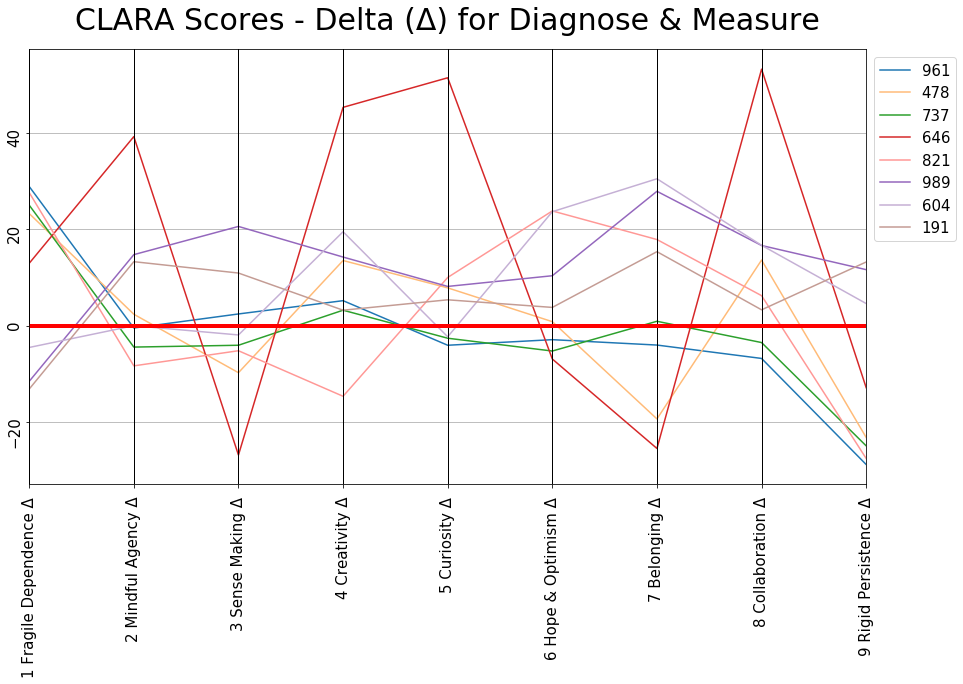

In [56]:
# plot the different columns as a parrllel coordinate chart
title = "CLARA Scores - Delta (\u0394) for Diagnose & Measure"
parallelCoords(dfParaCoord, analyse_variable, lstColour, title, baseline=0)

# need to add a base line at 0

# Plot the Means


## Parallel Coordinates

In [57]:
# create the df to pass to the function
dfParaCoord = dfMeans[[
    'Summary', 'Fragile Dependence', 'Mindful Agency', 'Sense Making',
    'Creativity', 'Curiosity', 'Hope & Optimism', 'Belonging', 'Collaboration',
    'Rigid Persistence'
]]

# rename the columns to be user friendly
dfParaCoord.columns = [
    'Summary', 'Fragile Dependence \u03BC ', 'Mindful Agency \u03BC ',
    'Sense Making \u03BC ', 'Creativity \u03BC ', 'Curiosity \u03BC ',
    'Hope & Optimism \u03BC ', 'Belonging \u03BC ', 'Collaboration \u03BC ',
    'Rigid Persistence \u03BC '
]

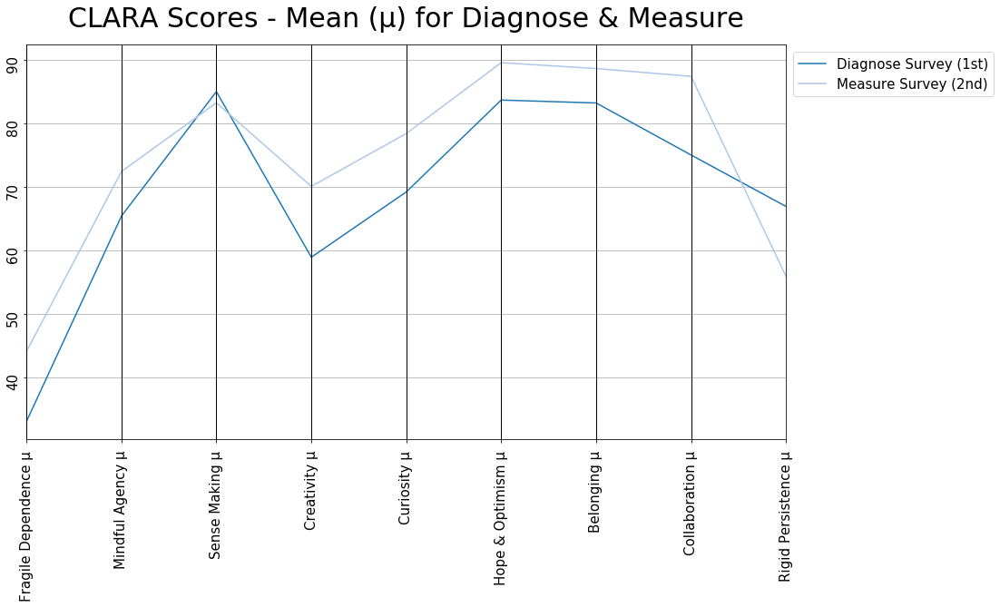

In [58]:
# plot the different columns as a parrllel coordinate chart
title = "CLARA Scores - Mean (\u03BC) for Diagnose & Measure"
parallelCoords(dfParaCoord, "Summary", my_colors, title)

In [59]:
if cleanUp:
    del dfParaCoord

## Radar Combined Chart

In [60]:
# Make a subset of the data so it is easier to work with
dfRadar = dfMeans[[
    'Summary', 'Mindful Agency', 'Sense Making', 'Creativity', 'Curiosity',
    'Hope & Optimism', 'Belonging', 'Collaboration', 'Orientation to Learning'
]].copy()

In [61]:
# Calculate the total sample size. This is used to calc the sample size % on the chart
# just counting rows
sampletotal = len(dfRadar.index)
if verbose:
    display(sampletotal)

2

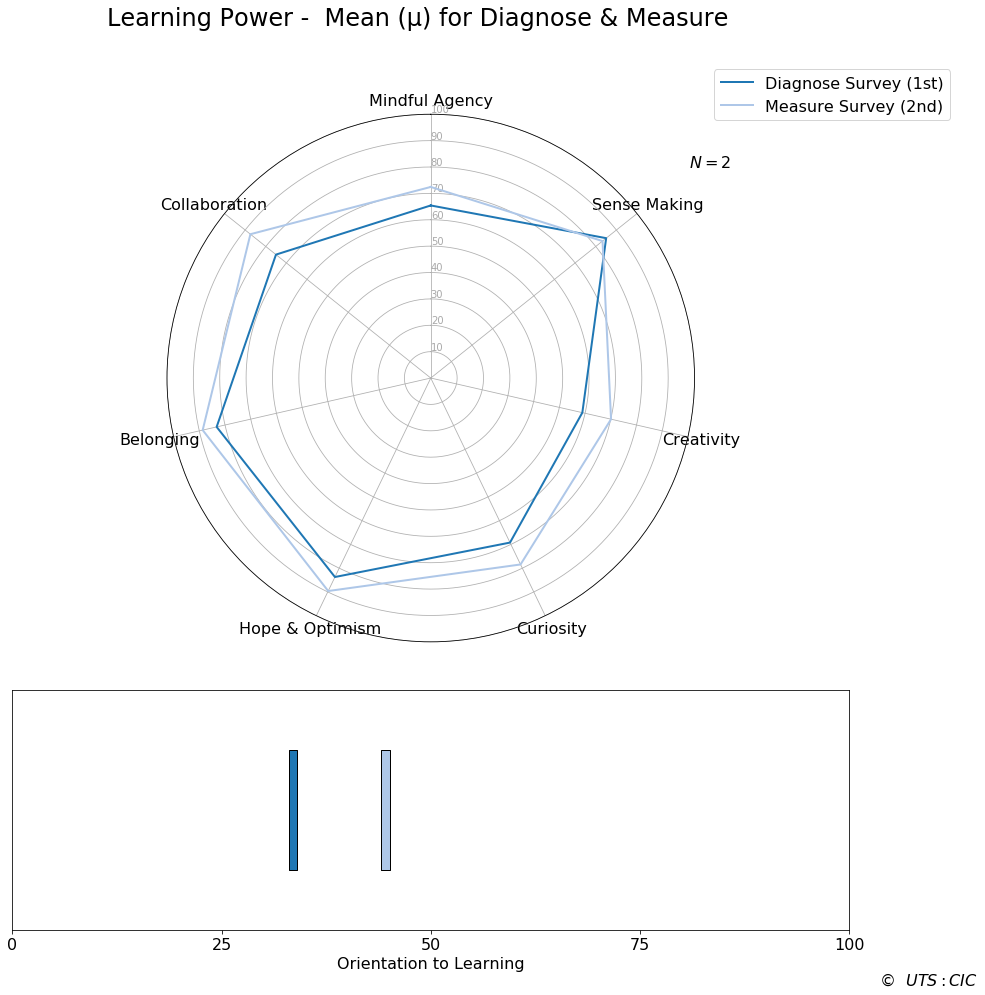

----------------------------------------------------------------------------------------------------


In [62]:
title = 'Learning Power -  Mean (\u03BC) for Diagnose & Measure'
combinedCharts(dfRadar, 'Summary', sampletotal, title, my_colors)

In [63]:
# clean up  unneeded variables
if cleanUp:
    del dfRadar

# Text Based Feedback
This section will look to provide feedback as text.

72% of cohort <NAME> (i.e. N of TOTAL) show a significant increase in Curiosity pre/post test.
24% of cohort <NAME> show worryingly low Agency (i.e. <1.5 on the dimension)
87% of the cohort reporting high collaboration are from <Faculty> 
Etc


In [64]:
#Create a new data frame just to make it more manageable -This can be removed if required.
dfText = df2ndSurveyResults[[
    "Student Index", "Belonging Difference", "Mindful Agency Difference",
    "Sense Making Difference", "Creativity Difference", "Curiosity Difference",
    "Hope & Optimism Difference", "Collaboration Difference",
    "Orientation to Learning Difference"
]].copy().reset_index(drop=True)

### Highest scores

This looks to see which student received the most number of highest scores

In [65]:
maxresult = []
for column in dfText.iloc[:, 1:]:
    maxresult.append(dfText[column].idxmax())

d = dict((i, maxresult.count(i)) for i in maxresult)

In [66]:
#create a list of indexes of students who had the highest number
# this is all students who received the highest score in each category
maxresult = []
for column in dfText.iloc[:, 1:]:
    maxresult.append(dfText[column].idxmax())

# Use the previous list of students and work out how many times the student received the highest score
d = dict((i, maxresult.count(i)) for i in maxresult)

# header statement
print(
    'The list of students with the highest number of dimensions that have positvely changed are:'
)
# Loop through all the students who received the highest score and print out this info
for key, value in sorted(d.items(), key=lambda x: x[1], reverse=True):
    # print the students id and the tally
    print('Student: ' + str(dfText["Student Index"].iloc[key]) + " had " +
          str(value) + ' dimensions with the highest positive change')

The list of students with the highest number of dimensions that have positvely changed are:
Student: 646 had 4 dimensions with the highest positive change
Student: 604 had 1 dimensions with the highest positive change
Student: 989 had 1 dimensions with the highest positive change
Student: 821 had 1 dimensions with the highest positive change
Student: 961 had 1 dimensions with the highest positive change


In [67]:
dfText.style.highlight_max(subset=[
    "Belonging Difference", "Mindful Agency Difference",
    "Sense Making Difference", "Creativity Difference", "Curiosity Difference",
    "Hope & Optimism Difference", "Collaboration Difference",
    "Orientation to Learning Difference"
])

,Student Index,Belonging Difference,Mindful Agency Difference,Sense Making Difference,Creativity Difference,Curiosity Difference,Hope & Optimism Difference,Collaboration Difference,Orientation to Learning Difference
0,961,-4.06,-0.52,2.4,5.16,-4.1,-2.94,-6.84,28.88
1,478,-19.4,2.34,-9.8,13.5,7.82,0.8,13.6,23.26
2,737,0.88,-4.48,-4.1,3.18,-2.64,-5.3,-3.54,25
3,646,-25.54,39.24,-26.9,45.32,51.46,-6.96,53.24,12.92
4,821,17.86,-8.38,-5.24,-14.7,9.98,23.8,6.2,27.62
5,989,27.88,14.72,20.58,14.22,8.12,10.34,16.62,-11.6
6,604,30.48,-0.04,-1.96,19.48,-2.34,23.64,16.66,-4.56
7,191,15.34,13.26,10.9,3.18,5.34,3.76,3.26,-13.2


### Lowest scores

This looks to see which student received the most number of lowest scores

In [68]:
dfText.style.highlight_min(subset=[
    "Belonging Difference", "Mindful Agency Difference",
    "Sense Making Difference", "Creativity Difference", "Curiosity Difference",
    "Hope & Optimism Difference", "Collaboration Difference",
    "Orientation to Learning Difference"
])

,Student Index,Belonging Difference,Mindful Agency Difference,Sense Making Difference,Creativity Difference,Curiosity Difference,Hope & Optimism Difference,Collaboration Difference,Orientation to Learning Difference
0,961,-4.06,-0.52,2.4,5.16,-4.1,-2.94,-6.84,28.88
1,478,-19.4,2.34,-9.8,13.5,7.82,0.8,13.6,23.26
2,737,0.88,-4.48,-4.1,3.18,-2.64,-5.3,-3.54,25
3,646,-25.54,39.24,-26.9,45.32,51.46,-6.96,53.24,12.92
4,821,17.86,-8.38,-5.24,-14.7,9.98,23.8,6.2,27.62
5,989,27.88,14.72,20.58,14.22,8.12,10.34,16.62,-11.6
6,604,30.48,-0.04,-1.96,19.48,-2.34,23.64,16.66,-4.56
7,191,15.34,13.26,10.9,3.18,5.34,3.76,3.26,-13.2


In [69]:
# for code explaination see max above

#create a list of indexes of students who had the highest number
minresult = []
for column in dfText.iloc[:, 1:]:
    minresult.append(dfText[column].idxmin())

d = dict((i, minresult.count(i)) for i in minresult)

print(
    'The list of students with the highest number of dimensions that have negatively changed are:'
)
for key, value in sorted(d.items(), key=lambda x: x[1], reverse=True):
    print('Student: ' + str(dfText["Student Index"].iloc[key]) + " had " +
          str(value) + ' dimensions with the highest negative change')

The list of students with the highest number of dimensions that have negatively changed are:
Student: 646 had 3 dimensions with the highest negative change
Student: 821 had 2 dimensions with the highest negative change
Student: 961 had 2 dimensions with the highest negative change
Student: 191 had 1 dimensions with the highest negative change


In [70]:
dfText.style.background_gradient(subset=[
    "Belonging Difference", "Mindful Agency Difference",
    "Sense Making Difference", "Creativity Difference", "Curiosity Difference",
    "Hope & Optimism Difference", "Collaboration Difference",
    "Orientation to Learning Difference"
])

,Student Index,Belonging Difference,Mindful Agency Difference,Sense Making Difference,Creativity Difference,Curiosity Difference,Hope & Optimism Difference,Collaboration Difference,Orientation to Learning Difference
0,961,-4.06,-0.52,2.4,5.16,-4.1,-2.94,-6.84,28.88
1,478,-19.4,2.34,-9.8,13.5,7.82,0.8,13.6,23.26
2,737,0.88,-4.48,-4.1,3.18,-2.64,-5.3,-3.54,25
3,646,-25.54,39.24,-26.9,45.32,51.46,-6.96,53.24,12.92
4,821,17.86,-8.38,-5.24,-14.7,9.98,23.8,6.2,27.62
5,989,27.88,14.72,20.58,14.22,8.12,10.34,16.62,-11.6
6,604,30.48,-0.04,-1.96,19.48,-2.34,23.64,16.66,-4.56
7,191,15.34,13.26,10.9,3.18,5.34,3.76,3.26,-13.2


In [71]:
dfText.style.bar(
    subset=[
        "Belonging Difference", "Mindful Agency Difference",
        "Sense Making Difference", "Creativity Difference",
        "Curiosity Difference", "Hope & Optimism Difference",
        "Collaboration Difference", "Orientation to Learning Difference"
    ],
    align='mid',
    color=['#006BA4', '#A3C8EC']
    #, color=['#995555', '#559955']
).applymap(color_negative_red).format("{:0.2f}")

,Student Index,Belonging Difference,Mindful Agency Difference,Sense Making Difference,Creativity Difference,Curiosity Difference,Hope & Optimism Difference,Collaboration Difference,Orientation to Learning Difference
0,961.00,-4.06,-0.52,2.40,5.16,-4.10,-2.94,-6.84,28.88
1,478.00,-19.40,2.34,-9.80,13.50,7.82,0.80,13.60,23.26
2,737.00,0.88,-4.48,-4.10,3.18,-2.64,-5.30,-3.54,25.00
3,646.00,-25.54,39.24,-26.90,45.32,51.46,-6.96,53.24,12.92
4,821.00,17.86,-8.38,-5.24,-14.70,9.98,23.80,6.20,27.62
5,989.00,27.88,14.72,20.58,14.22,8.12,10.34,16.62,-11.60
6,604.00,30.48,-0.04,-1.96,19.48,-2.34,23.64,16.66,-4.56
7,191.00,15.34,13.26,10.90,3.18,5.34,3.76,3.26,-13.20


# 5 Number Summary
These are the summary stats for the two surveys as well as the difference.

In [72]:
dfSurveyOne = df[[
    analyse_variable, 'Mindful Agency', 'Sense Making', 'Creativity',
    'Curiosity', 'Hope & Optimism', 'Belonging', 'Collaboration',
    'Orientation to Learning'
]].copy()

dfFiveNumSurveyOne = dfSurveyOne.iloc[:, 1:].describe()
dfFiveNumSurveyOne.style.bar(
    subset=[
        "Belonging", "Mindful Agency", "Sense Making", "Creativity",
        "Curiosity", "Hope & Optimism", "Collaboration",
        "Orientation to Learning"
    ],
    align='mid',
    color=['#006BA4', '#A3C8EC'],
    axis=1  # this makes it row wise
).applymap(color_negative_red).format("{:0.2f}")

,Mindful Agency,Sense Making,Creativity,Curiosity,Hope & Optimism,Belonging,Collaboration,Orientation to Learning
count,12.00,12.00,12.00,12.00,12.00,12.00,12.00,12.00
mean,66.39,87.64,58.45,69.31,85.19,81.45,81.44,39.92
std,15.47,9.94,18.47,23.46,14.07,15.64,22.09,17.37
min,24.24,66.62,10.00,6.32,53.30,52.78,16.70,18.66
25%,63.62,85.98,56.73,63.74,74.57,70.45,79.25,26.27
50%,65.76,91.29,61.39,73.31,88.82,85.10,90.02,38.02
75%,73.68,94.40,68.72,86.06,95.28,95.28,90.90,45.88
max,88.86,96.60,79.88,94.48,100.00,100.00,100.00,77.56


In [73]:
dfSurveyTwo = df[[
    analyse_variable, 'Mindful Agency 2', 'Sense Making 2', 'Creativity 2',
    'Curiosity 2', 'Hope & Optimism 2', 'Belonging 2', 'Collaboration 2',
    'Orientation to Learning 2'
]].copy()

dfFiveNumSurveyTwo = dfSurveyTwo.iloc[:, 1:].describe()
dfFiveNumSurveyTwo.style.bar(
    subset=[
        "Belonging 2", "Mindful Agency 2", "Sense Making 2", "Creativity 2",
        "Curiosity 2", "Hope & Optimism 2", "Collaboration 2",
        "Orientation to Learning 2"
    ],
    align='mid',
    color=['#006BA4', '#A3C8EC'],
    axis=1).applymap(color_negative_red).format("{:0.2f}")

,Mindful Agency 2,Sense Making 2,Creativity 2,Curiosity 2,Hope & Optimism 2,Belonging 2,Collaboration 2,Orientation to Learning 2
count,8.00,8.00,8.00,8.00,8.00,8.00,8.00,8.00
mean,72.44,83.28,70.10,78.43,89.61,88.68,87.45,44.10
std,13.13,13.69,16.35,13.03,11.28,12.48,7.96,21.64
min,54.18,61.38,39.42,57.78,68.00,70.64,69.94,10.14
25%,62.64,73.67,59.73,67.45,86.52,76.02,86.47,34.23
50%,71.99,90.19,77.76,81.80,93.99,95.94,88.27,43.82
75%,81.86,93.11,81.94,87.10,97.05,96.95,90.90,61.48
max,89.72,95.96,85.04,94.14,100.00,100.00,96.78,71.28


In [74]:
# Calculate the 5 number statistics for the different columns
dfFiveNumSummary = dfText.iloc[:, 1:].describe()

In [75]:
dfFiveNumSummary.style.bar(
    subset=[
        "Belonging Difference", "Mindful Agency Difference",
        "Sense Making Difference", "Creativity Difference",
        "Curiosity Difference", "Hope & Optimism Difference",
        "Collaboration Difference", "Orientation to Learning Difference"
    ],
    align='mid',
    color=['#006BA4', '#A3C8EC'],
    axis=1).applymap(color_negative_red).format("{:0.2f}")

,Belonging Difference,Mindful Agency Difference,Sense Making Difference,Creativity Difference,Curiosity Difference,Hope & Optimism Difference,Collaboration Difference,Orientation to Learning Difference
count,8.00,8.00,8.00,8.00,8.00,8.00,8.00,8.00
mean,5.43,7.02,-1.76,11.17,9.21,5.89,12.40,11.04
std,20.94,15.28,14.10,17.25,17.95,12.27,18.71,18.07
min,-25.54,-8.38,-26.90,-14.70,-4.10,-6.96,-6.84,-13.20
25%,-7.90,-1.51,-6.38,3.18,-2.42,-3.53,1.56,-6.32
50%,8.11,1.15,-3.03,9.33,6.58,2.28,9.90,18.09
75%,20.37,13.62,4.53,15.53,8.59,13.67,16.63,25.66
max,30.48,39.24,20.58,45.32,51.46,23.80,53.24,28.88


https://stackoverflow.com/questions/44635626/rename-result-columns-from-pandas-aggregation-futurewarning-using-a-dict-with<br>
https://github.com/pandas-dev/pandas/issues/18366<br>
https://stackoverflow.com/questions/46694207/applying-different-aggregate-functions-to-different-columns-now-that-dict-with<br>
fix the below with this link

In [76]:
# set up a dict of heading names and their display values. These need to match the column headings

clara_columns_disp = {
    "Belonging Difference": "Belonging",
    "Mindful Agency Difference": "Mindful Agency",
    "Sense Making Difference": "Sense Making",
    "Creativity Difference": "Creativity",
    "Curiosity Difference": "Curiosity",
    "Hope & Optimism Difference": "Hope and Optimism",
    "Collaboration Difference": "Collaboration",
    "Orientation to Learning Difference": "Orientation to Learning"
}

# Step through each of the columns for the 5 number summary and print out the details.
for column in dfFiveNumSummary:  # iterates through each one printing the output
    print('\033[1m' + (clara_columns_disp.get(column, "error")) + '\033[0m')
    print('The mean of the change was %.2f' % dfFiveNumSummary.loc["mean", column] + ' with a median of %.2f' % dfFiveNumSummary.loc["50%", column] \
          + ' and a standard deviation of %.2f' % dfFiveNumSummary.loc["std",column])

    # calcualte the students who are in the top Quartlie
    lstStudent = '\n  * ' + ', \n  * '.join(
        str(e) for e in dfText["Student Index"].loc[
            dfText[column] >= dfFiveNumSummary.loc["75%", column]].tolist())
    # print them out
    print('The following students were in the top quartile for a change in the dimension of ' \
          + (clara_columns_disp.get(column, "error")) \
          + lstStudent)  # find all the students who are in the top quartile)

    # calculate the students who are in the bottom Quartlie
    lstStudent = '\n  * ' + ', \n  * '.join(
        str(e) for e in dfText["Student Index"].loc[
            dfText[column] <= dfFiveNumSummary.loc["25%", column]].tolist())
    # print them out
    print('The following students were in the bottom quartile for a change in the dimension of ' \
          + (clara_columns_disp.get(column, "error")) \
          + lstStudent)  # find all the students who are in the top quartile)

    # clear variables
    student = 0
    value = 0
    # calculate the the maximum value
    value = max(dfText[column])
    # calculate the students who got the maximum
    student = dfText["Student Index"][dfText[column] == value].tolist()
    # print the output
    print('The largest positive change was %.2f' % value + ' for student ' +
          str(student)[1:-1]
          )  # [1:-1] removes first and last characters of the list

    # calculate the the minimum value
    value = min(dfText[column])
    # calculate the students who got the minimum
    student = dfText["Student Index"][dfText[column] == value].tolist()
    # print the output
    print('The largest negative change was %.2f' % value + ' for student ' +
          str(student)[1:-1]
          )  # [1:-1] removes first and last characters of the list

    # add a new line at the end or each dimension
    print()

Belonging
The mean of the change was 5.43 with a median of 8.11 and a standard deviation of 20.94
The following students were in the top quartile for a change in the dimension of Belonging
  * 989, 
  * 604
The following students were in the bottom quartile for a change in the dimension of Belonging
  * 478, 
  * 646
The largest positive change was 30.48 for student 604
The largest negative change was -25.54 for student 646

Mindful Agency
The mean of the change was 7.02 with a median of 1.15 and a standard deviation of 15.28
The following students were in the top quartile for a change in the dimension of Mindful Agency
  * 646, 
  * 989
The following students were in the bottom quartile for a change in the dimension of Mindful Agency
  * 737, 
  * 821
The largest positive change was 39.24 for student 646
The largest negative change was -8.38 for student 821

Sense Making
The mean of the change was -1.76 with a median of -3.03 and a standard deviation of 14.10
The following students we

In [77]:
# clean up
if cleanUp:
    del dfSurveyOne, dfFiveNumSurveyOne, dfSurveyTwo, dfFiveNumSurveyTwo, dfFiveNumSummary, dfText, lstStudent

# Clustering
The following section clusters the data using KMeans and then plots that in different ways to show the different clusters

In [78]:
from sklearn.cluster import KMeans

In [79]:
# Create the cluster object
objCluster = KMeans(n_clusters=3, random_state=0, n_jobs=-1)

In [80]:
# create the data frame that will be used for clustering
dfCluster = df[[
    'Belonging', 'Collaboration', 'Creativity', 'Curiosity', 'Hope & Optimism',
    'Mindful Agency', 'Sense Making', 'Orientation to Learning'
    #,'age_at_first_survey'
]].copy()
if verbose:
    print("the shape before NaNs are dropped")
    print(dfCluster.shape)

# drop rows with NA in them
dfCluster = dfCluster.dropna()

if verbose:
    print("the shape after NaNs are dropped")
    print(dfCluster.shape)

the shape before NaNs are dropped
(12, 8)
the shape after NaNs are dropped
(12, 8)


In [81]:
# Create the KMeans data object
mdlKMeans = objCluster.fit(dfCluster)

In [82]:
# add the cluster label dereived from the KMeans algorithm to the data to label each row
dfCluster['cluster_label'] = mdlKMeans.labels_
if verbose:
    display(dfCluster)

,Belonging,Collaboration,Creativity,Curiosity,Hope & Optimism,Mindful Agency,Sense Making,Orientation to Learning,cluster_label
0,100.00,93.32,79.88,86.86,100.00,88.86,90.44,18.66,0
1,63.34,90.10,57.60,73.60,86.70,70.16,94.34,35.86,1
2,85.54,100.00,59.68,86.18,93.28,73.24,96.60,62.06,1
3,95.94,76.50,64.12,73.02,90.94,65.40,86.28,36.98,1
4,95.06,89.98,74.72,69.30,94.96,64.60,94.58,40.18,1
5,74.70,96.66,72.36,52.36,100.00,63.84,93.18,77.56,1
6,100.00,16.70,10.00,6.32,74.96,24.24,92.14,27.18,2
7,52.78,83.74,54.12,57.74,53.30,62.56,66.62,43.66,1
8,72.12,80.16,67.50,86.02,85.90,75.00,69.32,21.74,0
9,65.46,69.94,63.10,94.48,73.40,79.74,95.90,23.54,0


In [83]:
# split df into cluster groups
dfClusterGrouped = dfCluster.groupby(['cluster_label'], sort=True)

## Heat Map of Clusters

In [84]:
# compute sums for every column in every group
dfClusterSums = dfClusterGrouped.mean()
if verbose:
    display(dfClusterSums)

,Belonging,Collaboration,Creativity,Curiosity,Hope & Optimism,Mindful Agency,Sense Making,Orientation to Learning
cluster_label,,,,,,,,
0,79.193333,81.1400,70.160,89.1200,86.433333,81.2000,85.22,21.313333
1,79.980000,89.6425,60.115,69.7525,86.002500,66.1125,87.99,48.485000
2,100.000000,16.7000,10.000,6.3200,74.960000,24.2400,92.14,27.180000


In [85]:
import plotly
import plotly.graph_objs as go
plotly.offline.init_notebook_mode()

data = [
    go.Heatmap(
        z=dfClusterSums.values.tolist(),
        y=['Cluster 1', 'Cluster 2', 'Cluster 3'],
        x=[
            'Belonging', 'Collaboration', 'Creativity', 'Curiosity',
            'Hope & Optimism', 'Mindful Agency', 'Sense Making',
            'Orientation to Learning'
        ],
        colorscale='Viridis')
]

plotly.offline.iplot(data, filename='pandas-heatmap')

In [86]:
# Create summaries for the clusters
dfClusterMean = dfClusterGrouped.mean()
if verbose:
    display(dfClusterMean)

,Belonging,Collaboration,Creativity,Curiosity,Hope & Optimism,Mindful Agency,Sense Making,Orientation to Learning
cluster_label,,,,,,,,
0,79.193333,81.1400,70.160,89.1200,86.433333,81.2000,85.22,21.313333
1,79.980000,89.6425,60.115,69.7525,86.002500,66.1125,87.99,48.485000
2,100.000000,16.7000,10.000,6.3200,74.960000,24.2400,92.14,27.180000


In [87]:
# Create counts of the sample sizes for the different clusters
dfClusterCount = dfClusterGrouped.count()
if verbose:
    display(dfClusterCount)
    display(dfClusterMean)

,Belonging,Collaboration,Creativity,Curiosity,Hope & Optimism,Mindful Agency,Sense Making,Orientation to Learning
cluster_label,,,,,,,,
0,3,3,3,3,3,3,3,3
1,8,8,8,8,8,8,8,8
2,1,1,1,1,1,1,1,1


,Belonging,Collaboration,Creativity,Curiosity,Hope & Optimism,Mindful Agency,Sense Making,Orientation to Learning
cluster_label,,,,,,,,
0,79.193333,81.1400,70.160,89.1200,86.433333,81.2000,85.22,21.313333
1,79.980000,89.6425,60.115,69.7525,86.002500,66.1125,87.99,48.485000
2,100.000000,16.7000,10.000,6.3200,74.960000,24.2400,92.14,27.180000


In [88]:
# insert a new columns with the cluster counts
dfClusterMean.insert(0, 'cluster_label', dfClusterMean.index.values)
dfClusterMean.insert(1, 'count', dfClusterCount['Belonging'])

if verbose:
    display(dfClusterMean)

,cluster_label,count,Belonging,Collaboration,Creativity,Curiosity,Hope & Optimism,Mindful Agency,Sense Making,Orientation to Learning
cluster_label,,,,,,,,,,
0,0,3,79.193333,81.1400,70.160,89.1200,86.433333,81.2000,85.22,21.313333
1,1,8,79.980000,89.6425,60.115,69.7525,86.002500,66.1125,87.99,48.485000
2,2,1,100.000000,16.7000,10.000,6.3200,74.960000,24.2400,92.14,27.180000


## Cluster Radar Combined Chart

In [89]:
# Make a subset of the data so it is easier to work with
dfRadar = dfClusterMean[[
    'cluster_label', 'count', 'Mindful Agency', 'Sense Making', 'Creativity',
    'Curiosity', 'Hope & Optimism', 'Belonging', 'Collaboration',
    'Orientation to Learning'
]].copy()

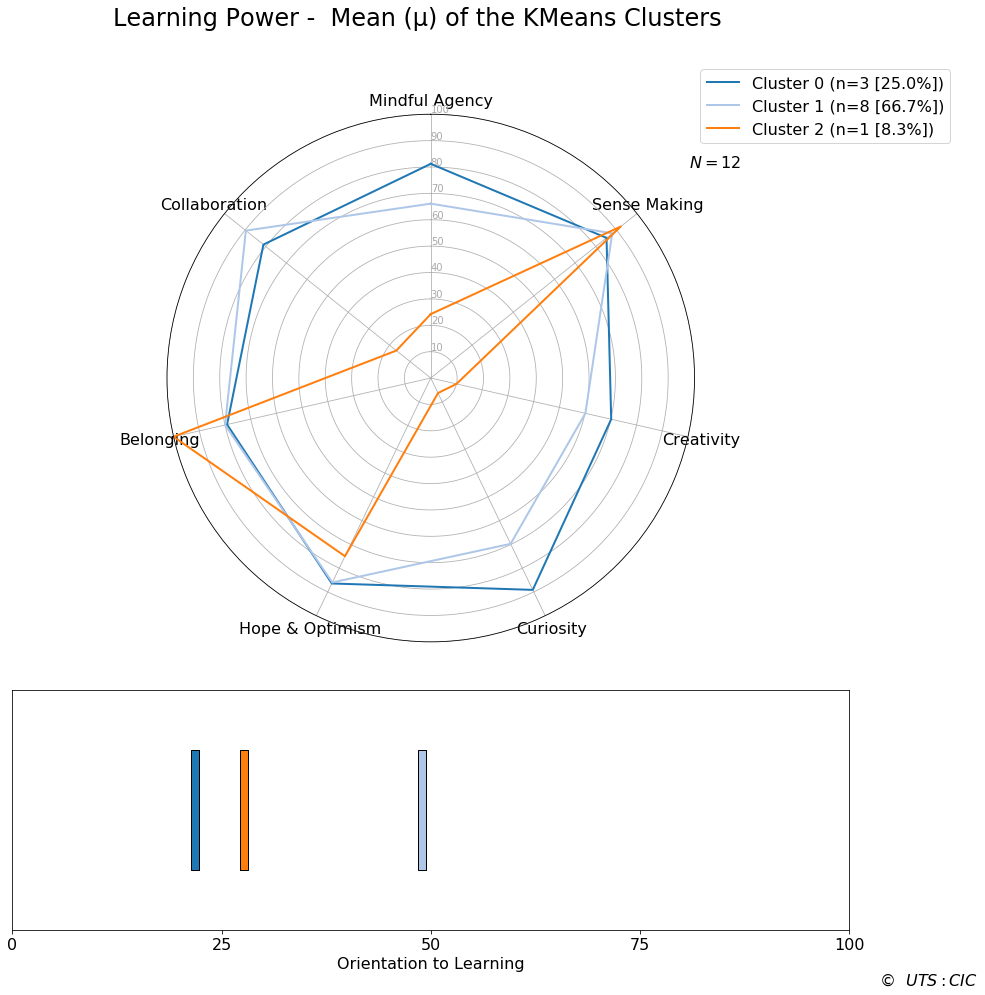

----------------------------------------------------------------------------------------------------


In [90]:
title = 'Learning Power -  Mean (\u03BC) of the KMeans Clusters'
combinedChartsMultiSample(dfRadar, 'Cluster', title, my_colors)

In [91]:
# clean up
if cleanUp: 
    del dfClusterGrouped, dfClusterCount, dfClusterMean, dfClusterSums, dfRadar, objCluster, mdlKMeans, dfCluster, dfMeans
    del df2ndSurveyResults, df

In [92]:
if cleanUp:
    # show the objects that are still in memory - check to see if they need cleaning up
    dir()

In [93]:
dir()

['In',
 'KMeans',
 'MongoClient',
 'ObjectId',
 'Out',
 '_',
 '_67',
 '_68',
 '_70',
 '_71',
 '_72',
 '_73',
 '_75',
 '__',
 '___',
 '__builtin__',
 '__builtins__',
 '__doc__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 '_dh',
 '_i',
 '_i1',
 '_i10',
 '_i11',
 '_i12',
 '_i13',
 '_i14',
 '_i15',
 '_i16',
 '_i17',
 '_i18',
 '_i19',
 '_i2',
 '_i20',
 '_i21',
 '_i22',
 '_i23',
 '_i24',
 '_i25',
 '_i26',
 '_i27',
 '_i28',
 '_i29',
 '_i3',
 '_i30',
 '_i31',
 '_i32',
 '_i33',
 '_i34',
 '_i35',
 '_i36',
 '_i37',
 '_i38',
 '_i39',
 '_i4',
 '_i40',
 '_i41',
 '_i42',
 '_i43',
 '_i44',
 '_i45',
 '_i46',
 '_i47',
 '_i48',
 '_i49',
 '_i5',
 '_i50',
 '_i51',
 '_i52',
 '_i53',
 '_i54',
 '_i55',
 '_i56',
 '_i57',
 '_i58',
 '_i59',
 '_i6',
 '_i60',
 '_i61',
 '_i62',
 '_i63',
 '_i64',
 '_i65',
 '_i66',
 '_i67',
 '_i68',
 '_i69',
 '_i7',
 '_i70',
 '_i71',
 '_i72',
 '_i73',
 '_i74',
 '_i75',
 '_i76',
 '_i77',
 '_i78',
 '_i79',
 '_i8',
 '_i80',
 '_i81',
 '_i82',
 '_i83',
 '_i84',
 '_i85',
 '_